# Quant Factors

_UNDER CONSTRUCTION_


- return predicting signals (Green et al 2013, and others), factor zoo
- performance evaluation


In [1]:
from pandas import DataFrame, Series
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from datetime import datetime
from typing import List, Tuple, Any, Dict
from finds.database import SQL, RedisDB
from finds.structured import Stocks, Benchmarks, Signals, SignalsFrame, CRSP, PSTAT, IBES
from finds.busday import BusDay
from finds.backtesting import BackTest, univariate_sorts, fractiles
from finds.finance import maximum_drawdown
from finds.misc import Show
from secret import credentials, paths, CRSP_DATE
show = Show(ndigits=4, latex=None)
pd.set_option('display.max_rows', None)
VERBOSE = 0
#%matplotlib qt
LAST_DATE = CRSP_DATE

In [2]:
# open connections
imgdir = paths['images']
sql = SQL(**credentials['sql'], verbose=VERBOSE)
user = SQL(**credentials['user'], verbose=VERBOSE)
rdb = RedisDB(**credentials['redis'])
bd = BusDay(sql, verbose=VERBOSE)
crsp = CRSP(sql, bd, rdb=rdb, verbose=VERBOSE)
pstat = PSTAT(sql, bd, verbose=VERBOSE)
bench = Benchmarks(sql, bd, verbose=VERBOSE)
signals = Signals(user, verbose=VERBOSE)
ibes = IBES(sql, bd, verbose=VERBOSE)
backtest = BackTest(user, bench, 'RF', LAST_DATE, verbose=VERBOSE)
outdir = paths['images'] / 'factors'

In [ ]:
# TODO
#
# drop penny stocks $1 and microcap (smallest quintile)
# decile spreads
#


In [3]:
# signals to flip signs when forming spread portfolios
leverage = {'mom1m':-1, 'mom36m':-1, 'pricedelay':-1, 'absacc':-1, 'acc':-1,
            'agr':-1, 'chcsho':-1, 'egr':-1, 'mve_ia':-1, 'pctacc':-1,
            'aeavol':-1, 'disp':-1, 'stdacc':-1, 'stdcf':-1, 'secured':-1,
            'maxret':-1, 'ill':-1, 'zerotrade':-1, 'cashpr':-1, 'chinv':-1,
            'invest':-1, 'cinvest':-1, 'idiovol':-1, 'retvol':-1}

__Helper functions__

In [4]:
# to lag yearly characteristics
def as_lags(df, var, key, nlags):
    """Return dataframe with {nlags} of column {var}, same {key} value in row"""
    out = df[[var]].rename(columns={var: 0})      # first col: not shifted
    for i in range(1, nlags):
        prev = df[[key, var]].shift(i, fill_value=0) # next col: shifted i+1
        prev.loc[prev[key] != df[key], :] = np.nan   # require same {key} value
        out.insert(i, i, prev[var])
    return out

In [5]:
# rolling window of returns
def as_rolling(df, other, width=0, dropna=True):
    """join next dataframe to a sliding window with fixed number of columns"""
    df = df.join(other, how='outer', sort=True, rsuffix='r')
    if width and len(df.columns) > width:          # if wider than width
        df = df.iloc[:, (len(df.columns)-width):]  #    then drop first cols
    if dropna:                                     # drop empty rows
        df = df[df.count(axis=1) > 0]
    df.columns = list(range(len(df.columns)))
    return df

In [6]:
# pipeline to run backtest
def backtest_pipeline(backtest: BackTest,
                      stocks: Stocks,
                      holdings: DataFrame,
                      label: str,
                      benchnames: List[str],
                      suffix: str = '',
                      overlap: int = 0,
                      outdir: str ='',
                      num: int = None) -> DataFrame:
    """wrapper to run a backtest pipeline, and (optionally) save file and .jpg

    Args:
      backtest: To compute backtest results
      stocks: Where securities returns can be retrieved from (e.g. CRSP)
      holdings: dict (key int date) of Series holdings (key permno)
      label: Label of signal to backtest
      benchnames: Names of benchmarks to attribute portfolio performance
      overlap: Number of overlapping holdings to smooth
      num: Figure num to plot to

    Returns:
      DataFrame of performance returns in rows

    Notes:
      graph and summary statistics are output to jpg and (appended) html
      backtest object updated with performance and attribution data
    """
    summary = backtest(stocks, holdings, label, overlap=overlap)
    excess = backtest.fit(benchnames)
    backtest.write(label)
    backtest.plot(num=num, label=label + suffix)
    print(pd.Series(backtest.annualized,
                    name=label + suffix).to_frame().T.round(3).to_string())
    if outdir:  # output graph and summary statistics
        plt.savefig(outdir / (label + '.jpg'))
        
        # performance metrics from backtest to output
        sub = ['alpha', 'excess', 'appraisal', 'sharpe', 'welch-t', 'welch-p']
        with open(outdir / 'index.html', 'at') as f:
            f.write(f"<p><hr><h2>{label + suffix}</h2>\n<pre>\n")
            f.write("{}-{} {}\n".format(min(backtest.excess.index),
                                        max(backtest.excess.index),
                                        benchnames))
            f.write("{:12s} ".format("Annualized"))
            f.write("".join(f"{k:>10s}" for k in sub) + "\n")
            f.write("{:12s} ".format(label + ":"))
            f.write("".join(f"{backtest.annualized[k]:10.4f}" for k in sub))
            f.write(f"\n</pre>\n<img src='{label}.jpg'><p>{datetime.now()}\n")
    return summary

List subsets of signals to (optionally) generate and run backtest


In [7]:
testable = {'new', 'monthly', 'weekly', 'daily', 'pstann', 'pstqtr',
            'ibesf1', 'ibesltg', 'rdq_daily', 'ibesf1_hist', 'ibesf1_pstqtr',
            'ibesq1_pstqtr', 'summarize'}  # subset of steps to rerun
regenerate = True  # False to only run backtest (and not regenerate Signals)

# specify subsets for this run
#testable = {'rdq_daily', 'ibesf1_hist', 'ibesf1_pstqtr',
#            'ibesq1_pstqtr', 'summarize'}  # subset of steps to rerun

# (optionally) initialize webpages to output results
if 'new' in testable:
    with open(outdir / 'index.html', 'wt') as f:
        f.write('<h1>Quant Factors</h1><br>')
        f.write(' <br>')
        f.write('<p>\n')

## Past prices

        excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover   longs   shorts   buys  sells
mom12m   0.116   0.469  0.152      0.651   -1.378    0.169     4.278  172.74  142.784  4.248  4.308
       excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover   longs   shorts   buys  sells
mom6m   0.074   0.319  0.108      0.499   -0.461    0.645     5.957  171.15  150.073  5.937  5.976
       excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover   longs   shorts   buys  sells
chmom   0.069   0.415  0.053      0.326   -1.801    0.072     6.535  156.97  157.132  6.518  6.552
        excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
indmom   0.062   0.354  0.065      0.373   -1.116    0.265     4.857  106.519  161.022  4.841  4.874
        excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
divyld  -0.007  -0.035  0.039      0.254   -0.765    0.445      1.61  106.845  406.693  1.625  1.596


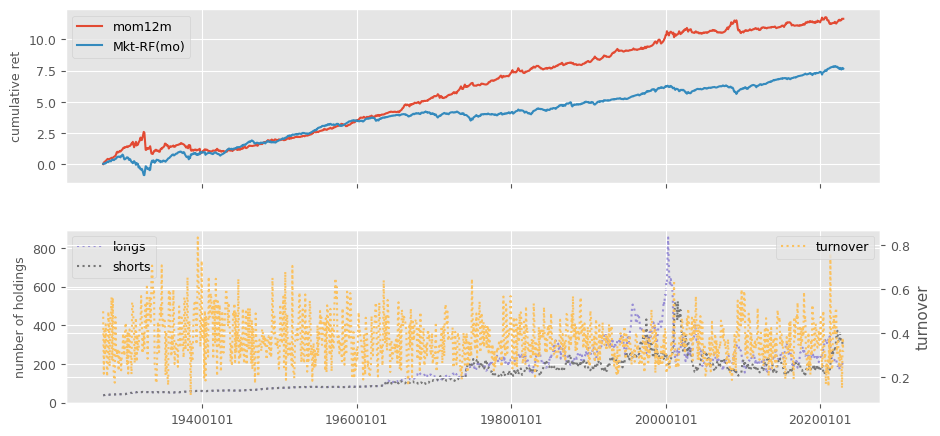

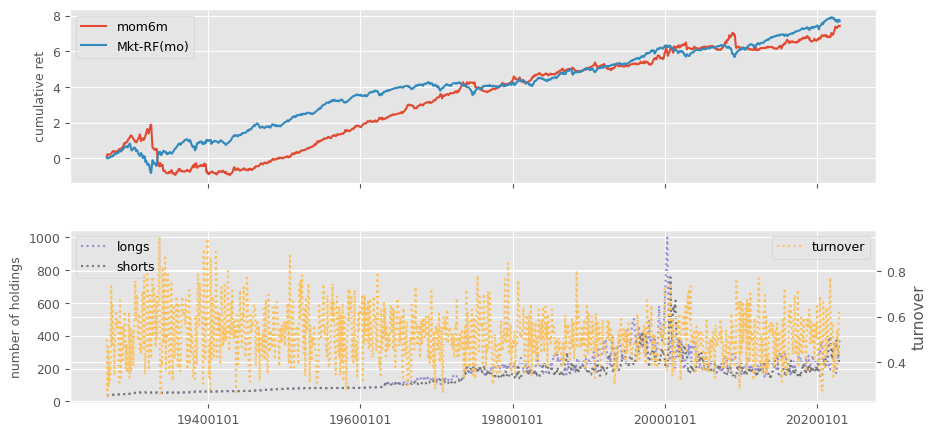

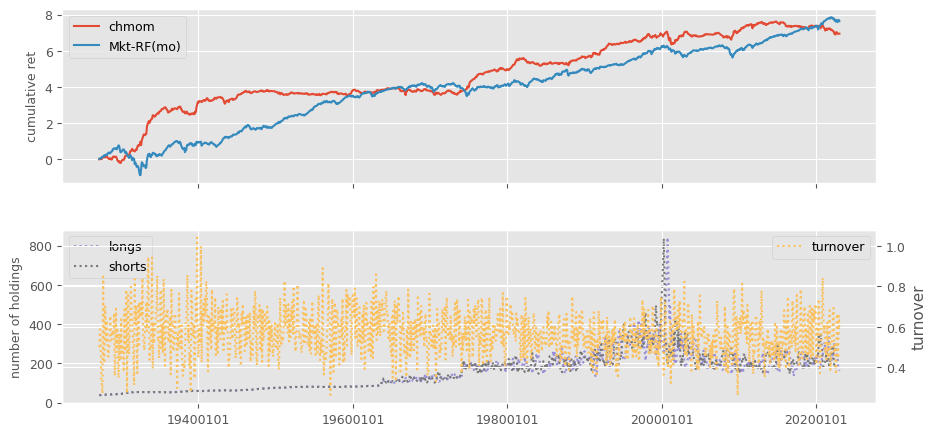

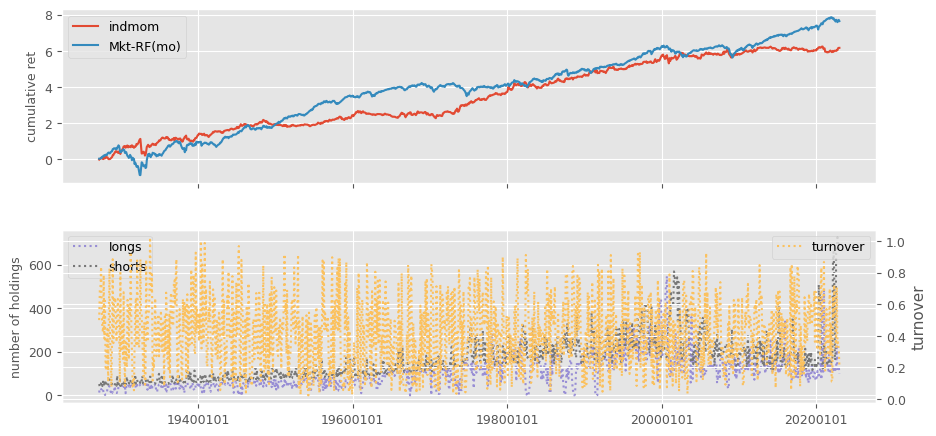

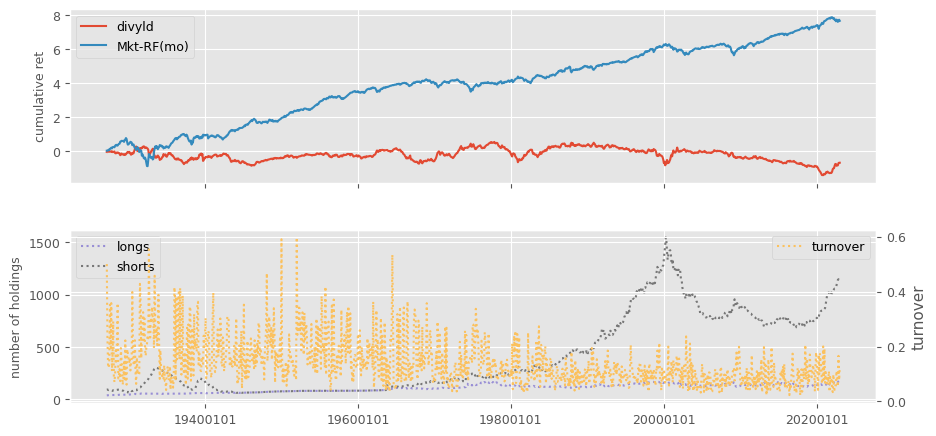

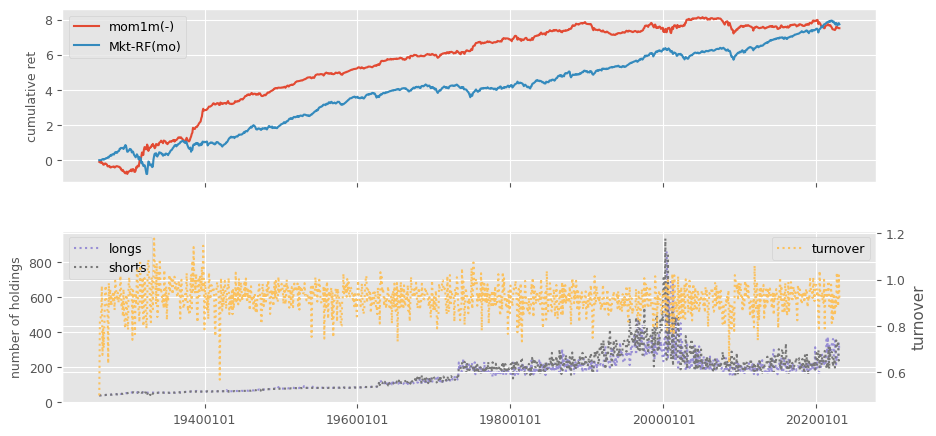

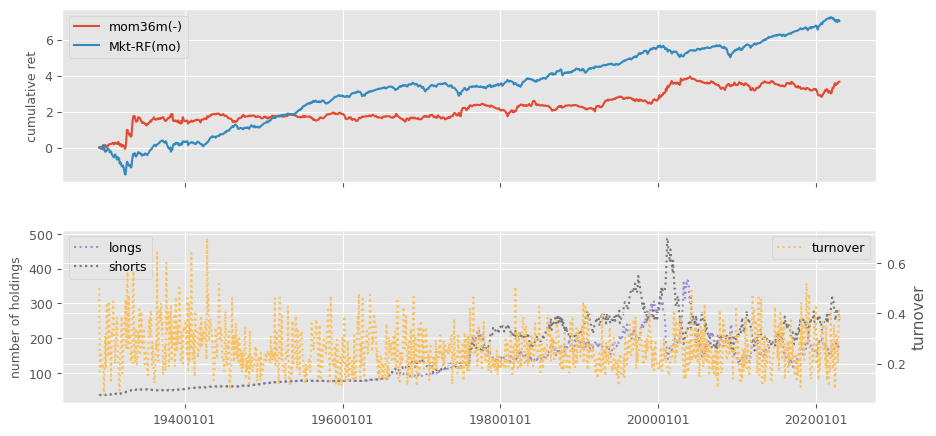

In [8]:
# Momentum and divyld from CRSP monthly
if 'monthly' in testable:
    if regenerate:
        beg, end = 19251231, LAST_DATE
        intervals = {'mom12m': (2,12),
                     'mom36m': (13,36),
                     'mom6m': (2,6),
                     'mom1m': (1,1)}
        for label, past in intervals.items():
            out = []
            rebaldates = bd.date_range(bd.endmo(beg, past[1]), end, 'endmo')
            for rebaldate in rebaldates:
                start = bd.endmo(rebaldate, -past[1])
                beg1 = bd.offset(start, 1)
                end1 = bd.endmo(rebaldate, 1-past[0])
                df = crsp.get_universe(end1)
                df['start'] = crsp.get_section(dataset='monthly',
                                               fields=['ret'],
                                               date_field='date',
                                               date=start).reindex(df.index)
                df[label] = crsp.get_ret(beg1, end1).reindex(df.index)
                df['permno'] = df.index
                df['rebaldate'] = rebaldate
                df = df.dropna(subset=['start'])
                out.append(df[['rebaldate', 'permno', label]]) # append rows
            out = pd.concat(out, axis=0, ignore_index=True)
            n = signals.write(out, label, overwrite=True)

        beg, end = 19270101, LAST_DATE
        columns = ['chmom', 'divyld', 'indmom']
        out = []
        for rebaldate in bd.date_range(beg, end, 'endmo'):
            start = bd.endmo(rebaldate, -12)
            beg1 = bd.offset(start, 1)
            end1 = bd.endmo(rebaldate, -6)
            beg2 = bd.offset(end1, 1)
            end2 = bd.endmo(rebaldate)
            df = crsp.get_universe(end1)
            df['start'] = crsp.get_section(dataset='monthly',
                                           fields=['ret'],
                                           date_field='date',
                                           date=start).reindex(df.index)
            df['end2'] = crsp.get_section(dataset='monthly',
                                          fields=['ret'],
                                          date_field='date',
                                          date=end2).reindex(df.index)
            df['mom2'] = crsp.get_ret(beg2, end2).reindex(df.index)
            df['mom1'] = crsp.get_ret(beg1, end1).reindex(df.index)
            df['divyld'] = crsp.get_divamt(beg1, end2)\
                               .reindex(df.index)['divamt']\
                               .div(df['cap'])\
                               .fillna(0)
            df['chmom'] = df['mom1'] - df['mom2']

            # 6-month two-digit sic industry momentum (group means of 'mom1')
            df['sic2'] = df['siccd'] // 100
            df = df.join(DataFrame(df.groupby(['sic2'])['mom1'].mean())\
                         .rename(columns={'mom1': 'indmom'}),
                         on='sic2', how='left')
            df['permno'] = df.index
            df['rebaldate'] = rebaldate
            out.append(df.dropna(subset=['start','end2'])\
                       [['rebaldate', 'permno'] + columns])
        out = pd.concat(out, axis=0, ignore_index=True)
        for label in columns:   # save signal values to sql
            n = signals.write(out, label, overwrite=True)

    benchnames = ['Mkt-RF(mo)']
    rebalbeg, rebalend = 19260101, LAST_DATE
    for num, label in enumerate(['mom12m', 'mom6m', 'chmom', 'indmom',
                                 'divyld', 'mom1m', 'mom36m']):
        holdings = univariate_sorts(crsp,
                                    label,
                                    SignalsFrame(signals.read(label)),
                                    rebalbeg,
                                    rebalend,
                                    window=1,
                                    months=[],
                                    maxdecile=8,
                                    pct=(10., 90.),
                                    leverage=leverage.get(label, 1))
        excess = backtest_pipeline(backtest,
                                   crsp,
                                   holdings,
                                   label,
                                   benchnames,
                                   overlap=0,
                                   outdir=outdir,
                                   suffix=(leverage.get(label, 1) < 0)*'(-)')

In [9]:
# helper to calculate beta, idiovol and price delay from weekly returns
def regress(x: np.array, y: np.array) -> Tuple[float, float, float]:
    """helper method to calculate beta, idiovol and price delay

    Args:
      x: equal-weighted market returns (in ascending time order)
      y: stock returns (in ascending time order).  NaN's will be discarded.

    Returns:
      beta: slope from regression on market returns and intercept
      idiovol: mean squared error of residuals
      pricedelay: increase of adjusted Rsq with four market lags over without
    """
    v = np.logical_not(np.isnan(y))
    y = y[v]
    x = x[v]
    n0 = len(y)
    A0 = np.vstack([x, np.ones(len(y))]).T
    b0 = np.linalg.inv(A0.T.dot(A0)).dot(A0.T.dot(y))   # univariate coeffs
    sse0 = np.mean((y - A0.dot(b0))**2)
    sst0 = np.mean((y - np.mean(y))**2)
    if (sst0>0 and sse0>0):
        R0 = (1 - ((sse0 / (n0 - 2)) / (sst0 / (n0 - 1))))
    else:
        R0 = 0
    y4 = y[4:]
    n4 = len(y4)         
    A4 = np.vstack([x[0:-4], x[1:-3], x[2:-2], x[3:-1], x[4:],
                    np.ones(n4)]).T
    b4 = np.linalg.inv(A4.T.dot(A4)).dot(A4.T.dot(y4))  # four lagged coeffs
    sse4 = np.mean((y4 - A4.dot(b4))**2)
    sst4 = np.mean((y4 - np.mean(y4))**2)
    if sst4 > 0 and sse4 > 0:
        R4 = (1 - ((sse4 / (n4 - 6)) / (sst4 / (n4 - 1))))
    else:
        R4 = 0    
    return [b0[0],
            sse0 or np.nan,
            (1 -(R0 / R4)) if R0>0 and R4>0 else np.nan]

Last FamaFrench Date 2023-04-28 00:00:00
      excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
beta   0.019   0.062 -0.075     -0.393   -0.538    0.591     1.238  183.442  126.235  1.226  1.251
            excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
idiovol(-)   0.001   0.003  0.053      0.271   -0.332     0.74      0.96  115.702  229.826  0.968  0.953
               excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
pricedelay(-)    0.01   0.107  0.005      0.054   -0.437    0.662     4.511  154.761  134.785  4.508  4.515


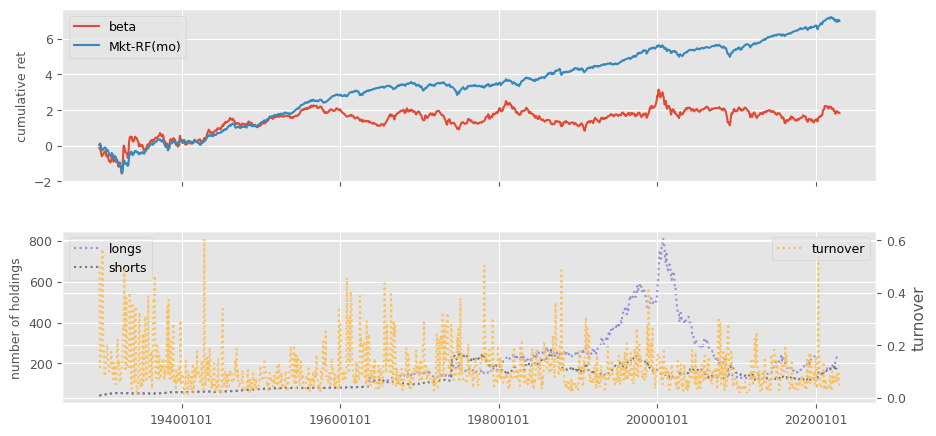

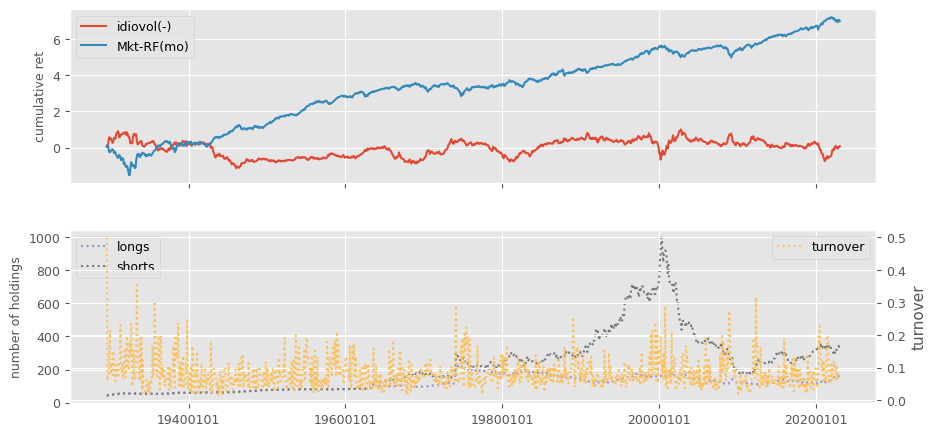

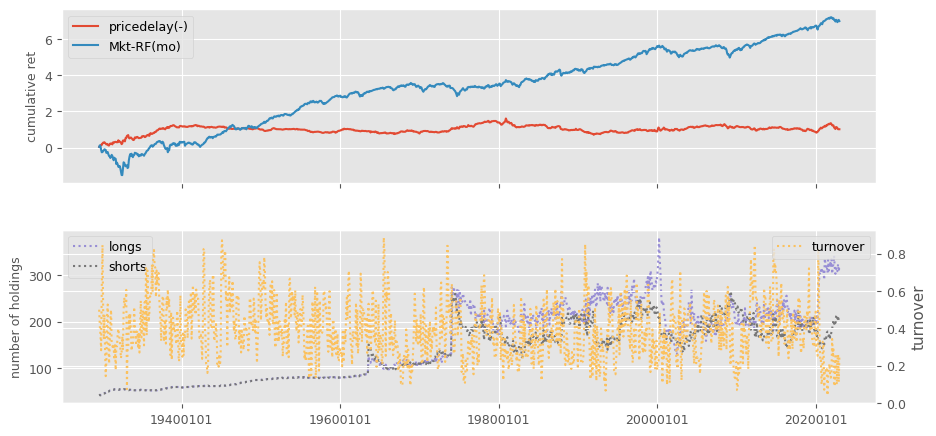

In [10]:
# Weekly returns-based price response signals
if 'weekly' in testable:    
    beg, end = 19260101, LAST_DATE
    columns  = ['beta', 'idiovol', 'pricedelay']
    wd = BusDay(sql, endweek='Wed')  # custom weekly trading day calendar
        
    width    = 3*52+1           # up to 3 years of weekly returns
    minvalid = 52               # at least 52 weeks required to compute beta
    weekly   = DataFrame()      # rolling window of weekly stock returns
    mkt      = DataFrame()      # to queue equal-weighted market returns
    out      = []               # to accumulate final calculations

    if regenerate:

        """
        # Pre-generate weekly returns and save in cache-store
        batchsize = 40
        r = bd.date_tuples(wd.date_range(beg, LAST_DATE))
        batches = [r[i:(i+batchsize)] for i in range(0, len(r), batchsize)]
        for batch in batches:
            crsp.cache_ret(batch, replace=True)
        """
        
        for date in wd.date_range(beg, end, 'weekly'):
            df = crsp.get_ret(wd.begwk(date), date)
            mkt = as_rolling(mkt,       # rolling window of weekly mkt returns
                             DataFrame(data=[df.mean()], columns=[date]),
                             width=width)
            weekly = as_rolling(weekly, # rolling window of weekly stock returns
                                df.rename(date),
                                width=width) 
            valid = weekly.count(axis=1) >= minvalid  # require min number weeks
            if valid.any():
                result = DataFrame([regress(mkt.values[0], y)
                                    for y in weekly.loc[valid].values],
                                   columns=columns)
                result['permno'] = weekly.index[valid].values
                result['rebaldate'] = date
                if wd.ismonthend(date): # signal value from last week of month
                    out.append(result)
        out = pd.concat(out, axis=0, ignore_index=True)
        for label in columns:
            signals.write(out, label, overwrite=True)

    benchnames = ['Mkt-RF(mo)']
    rebalbeg, rebalend = 19290601, LAST_DATE
    for num, label in enumerate(columns):
        holdings = univariate_sorts(crsp,
                                    label,
                                    SignalsFrame(signals.read(label)),
                                    rebalbeg,
                                    rebalend,
                                    window=1,
                                    months=[],
                                    maxdecile=8,
                                    pct=(10., 90.),
                                    leverage=leverage.get(label, 1))
        excess = backtest_pipeline(backtest,
                                   crsp,
                                   holdings,
                                   label,
                                   benchnames,
                                   overlap=0,
                                   outdir=outdir,
                                   suffix=(leverage.get(label, 1) < 0)*'(-)')

## Liquidity

100%|██████████| 40/40 [22:26<00:00, 33.67s/it]


        excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
ill(-)   0.034   0.294  0.043      0.371   -1.245    0.214     2.563  146.451  302.127  2.556  2.569
           excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
maxret(-)   0.055   0.251  0.123      0.698   -0.279     0.78      9.11  165.346  335.778  9.101  9.119
           excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs  shorts   buys  sells
retvol(-)   0.056   0.213  0.141      0.683   -0.191    0.849     7.483  162.215  370.73  7.475  7.492
          excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
baspread  -0.035  -0.128 -0.126     -0.601    0.165    0.869     5.114  434.074  156.268  5.117  5.112
            excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
std_dolvol    -0.0  -0.004  0.002      0.022    1.108    0.268      7.51 

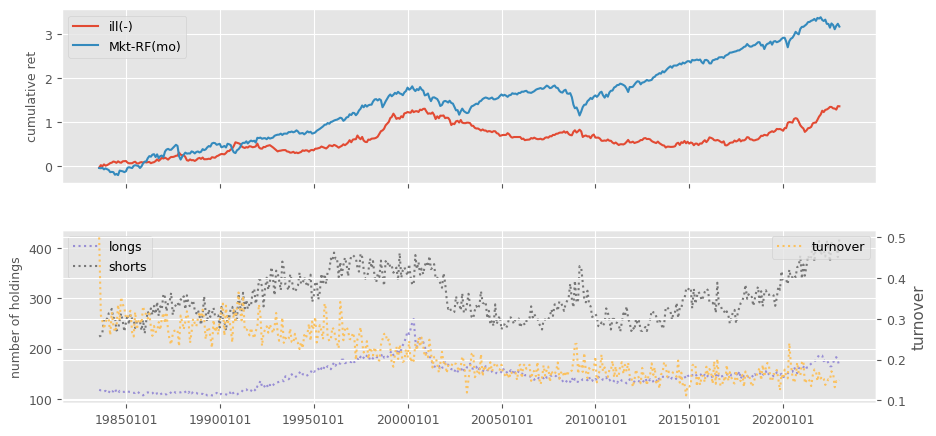

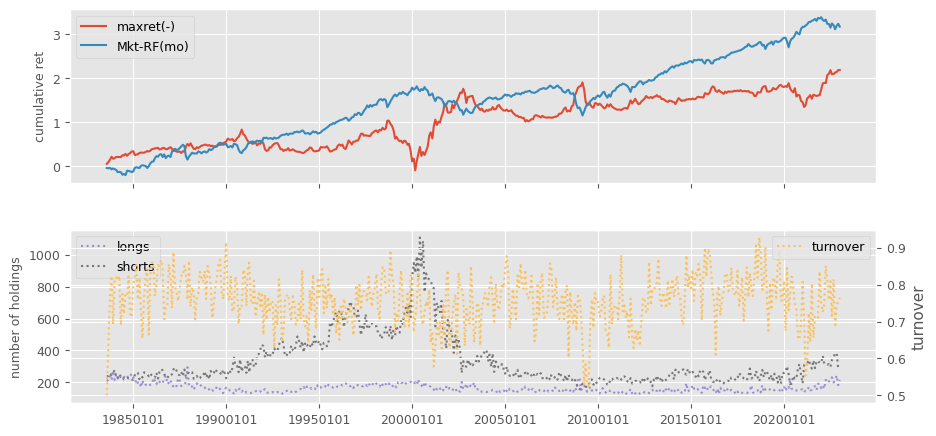

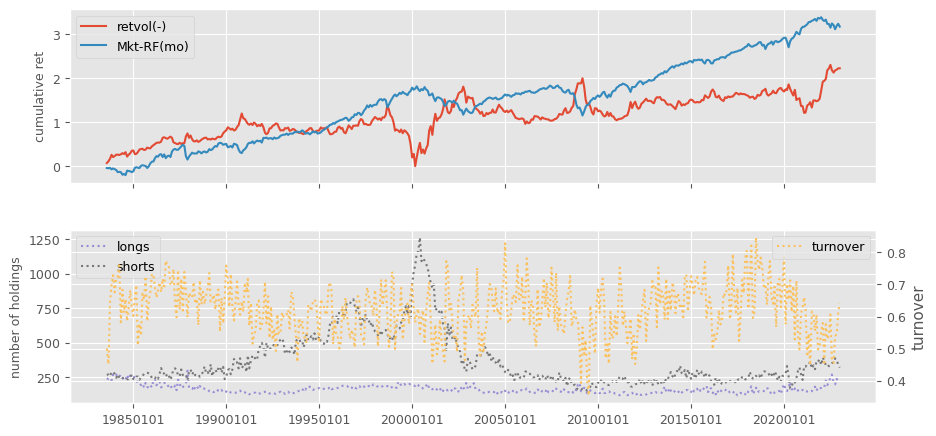

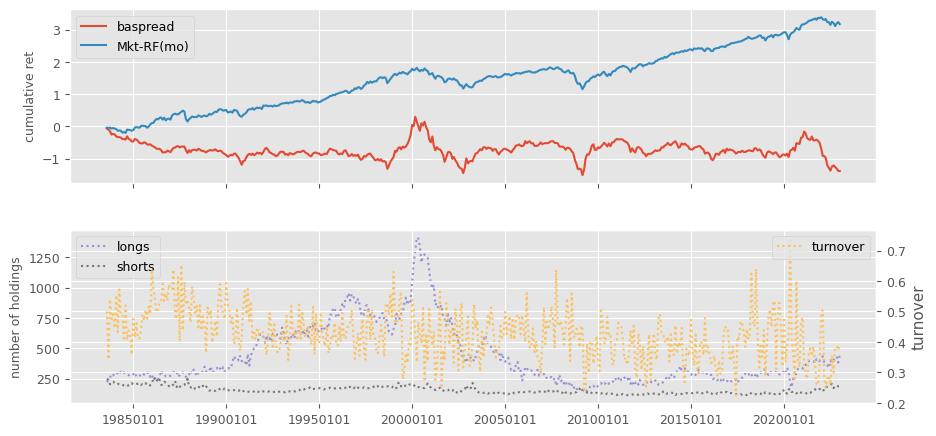

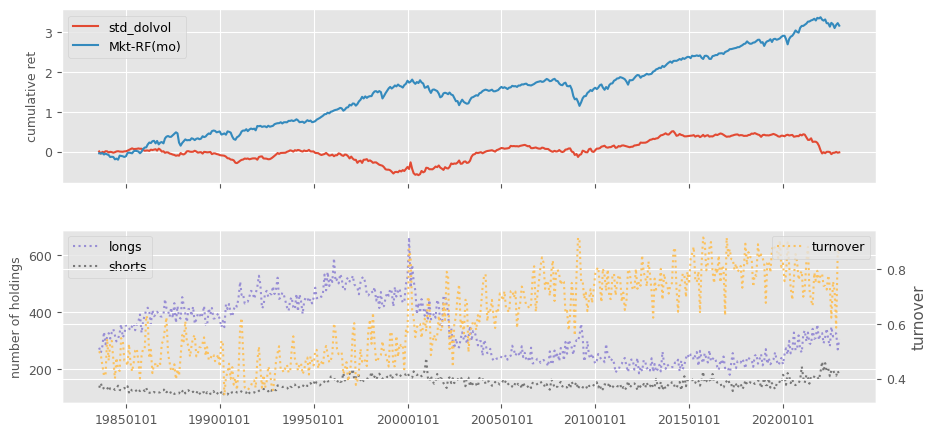

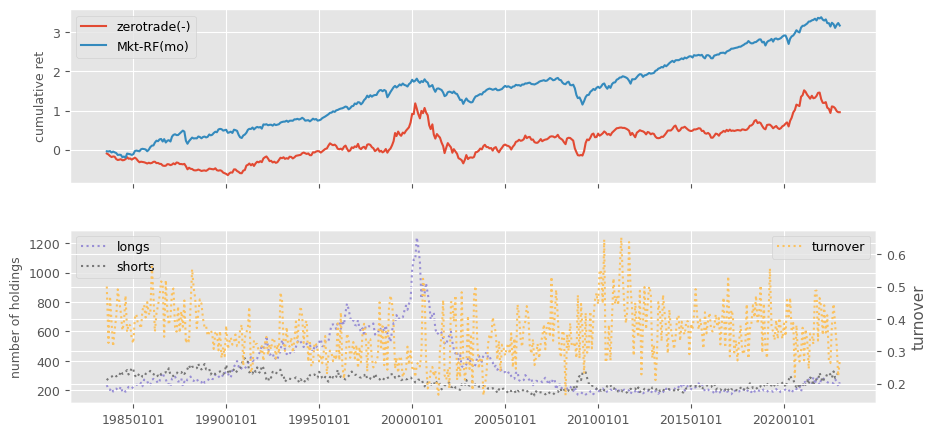

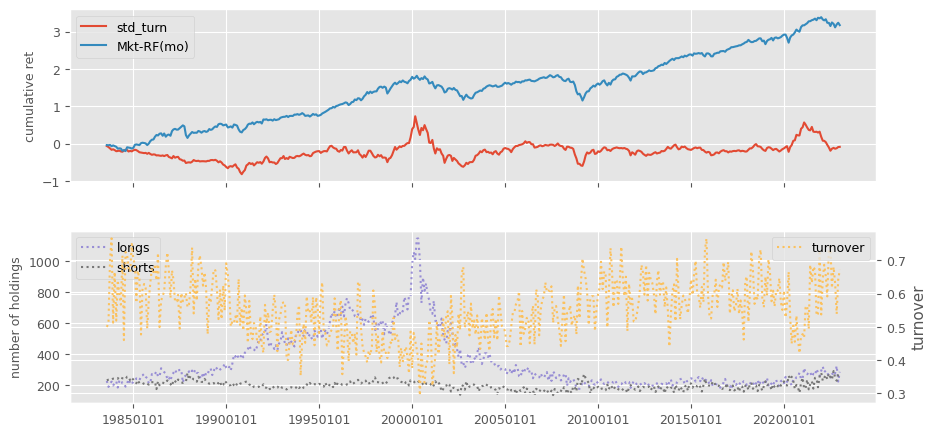

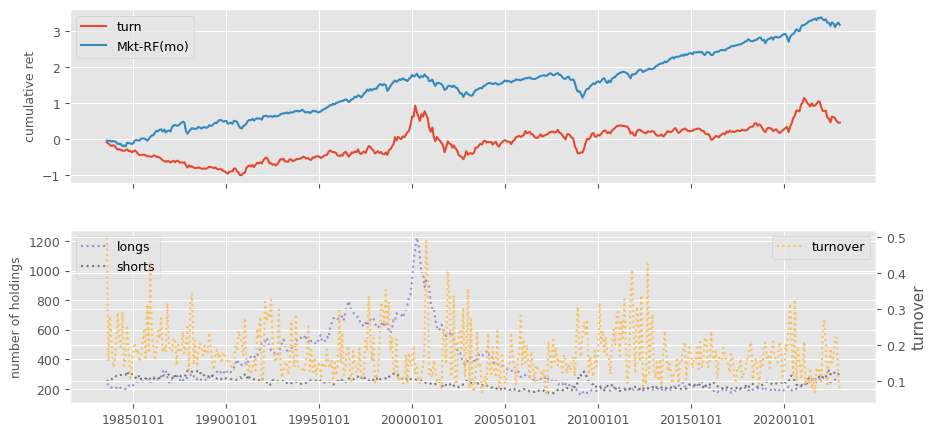

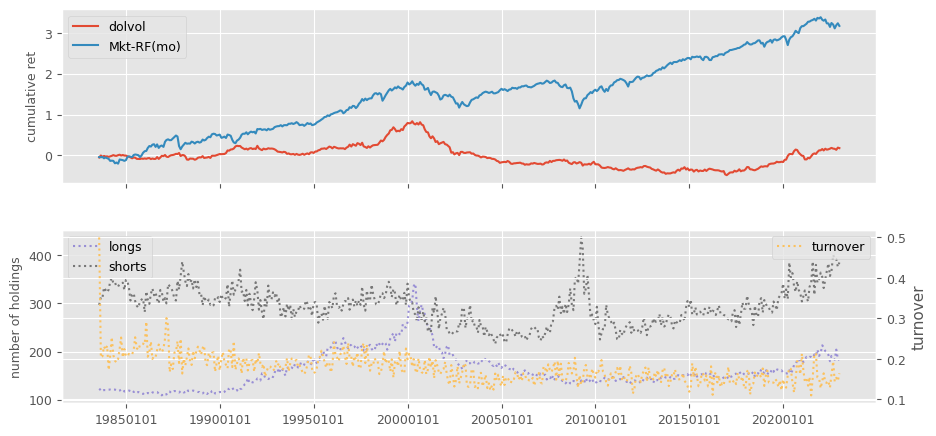

In [11]:
# Liquidity signals from daily stock returns
if 'daily' in testable:
    beg, end = 19830601, LAST_DATE    # nasdaq/volume from after 1982
    columns = ['ill', 'maxret', 'retvol', 'baspread', 'std_dolvol',
               'zerotrade', 'std_turn', 'turn']
    if regenerate:
        out = []
        dolvol = []
        turn = DataFrame()    # to average turn signal over rolling 3-months
        dt = bd.date_range(bd.begmo(beg,-3), end, 'endmo') # monthly rebalances
        chunksize = 12        # each chunk is 12 months (1 year)
        chunks = [dt[i:(i+chunksize)] for i in range(0, len(dt), chunksize)]
        for chunk in tqdm(chunks):
            q = (f"SELECT permno, date, ret, askhi, bidlo, prc, vol, shrout "
                 f" FROM {crsp['daily'].key}"
                 f" WHERE date>={bd.begmo(chunk[0])}"
                 f"   AND date<={chunk[-1]}")        # retrieve a chunk
            f = crsp.sql.read_dataframe(q).sort_values(['permno', 'date'])
            f['baspread'] = ((f['askhi'] - f['bidlo']) /
                             ((f['askhi'] + f['bidlo']) / 2))
            f['dolvol'] = f['prc'].abs() * f['vol']
            f['turn1'] = f['vol'] / f['shrout']
            f.loc[f['dolvol']>0, 'ldv'] = np.log(f.loc[f['dolvol']>0, 'dolvol'])
            f['ill'] = 1000000 * f['ret'].abs() / f['dolvol']

            for rebaldate in chunk:            # for each rebaldate in the chunk
                grouped = f[f['date'].ge(bd.begmo(rebaldate))
                            & f['date'].le(rebaldate)].groupby('permno')
                df = grouped[['ret']].max().rename(columns={'ret': 'maxret'})
                df['retvol'] = grouped['ret'].std()
                df['baspread'] = grouped['baspread'].mean()
                df['std_dolvol'] = grouped['ldv'].std()
                df['ill'] = grouped['ill'].mean()
                dv = grouped['dolvol'].sum()
                df.loc[dv > 0, 'dolvol'] = np.log(dv[dv > 0])
                df['turn1'] = grouped['turn1'].sum()
                df['std_turn'] = grouped['turn1'].std()
                df['countzero'] = grouped['vol'].apply(lambda v: sum(v==0))
                df['ndays'] = grouped['prc'].count()
            
                turn = as_rolling(turn, df[['turn1']], width=3)
                df['turn'] = turn.reindex(df.index).mean(axis=1, skipna=False)
                df.loc[df['turn1'].le(0), 'turn1'] = 0
                df.loc[df['ndays'].le(0), 'ndays'] = 0
                df['zerotrade'] = ((df['countzero'] + ((1/df['turn1'])/480000))
                                   * 21/df['ndays'])
    
                df['rebaldate'] = rebaldate
                df = df.reset_index()
                out.append(df[['permno', 'rebaldate'] + columns])
                if rebaldate < bd.endmo(end):
                    df['rebaldate'] = bd.endmo(rebaldate, 1)
                    dolvol.append(df[['permno','rebaldate','dolvol']])
        out = pd.concat(out, axis=0, ignore_index=True)
        dolvol = pd.concat(dolvol, axis=0, ignore_index=True)            

        for label in columns:
            n = signals.write(out, label, overwrite=True)
        n = signals.write(dolvol, 'dolvol', overwrite=True)

    rebalbeg, rebalend = 19830601, LAST_DATE
    benchnames = ['Mkt-RF(mo)']
    for num, label in enumerate(columns + ['dolvol']):
        holdings = univariate_sorts(crsp,
                                    label,
                                    SignalsFrame(signals.read(label)),
                                    rebalbeg,
                                    rebalend,
                                    window=1,
                                    months=[],
                                    maxdecile=8,
                                    pct=(10., 90.),
                                    leverage=leverage.get(label, 1))
        excess = backtest_pipeline(backtest,
                                   crsp,
                                   holdings,
                                   label,
                                   benchnames,
                                   overlap=0,
                                   outdir=outdir,
                                   suffix=(leverage.get(label, 1) < 0)*'(-)')

## Fundamentals

           excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
absacc(-)   0.014     0.1  0.029      0.209   -1.172    0.242     0.952  162.665  208.556  0.951  0.953
        excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
acc(-)   0.037   0.343  0.038      0.352   -1.204    0.229     0.961  189.726  187.287  0.952   0.97
        excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
agr(-)   0.043   0.374   0.06      0.552   -1.189    0.235     1.047  161.904  251.009  1.039  1.054
    excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
bm   0.046   0.292  0.044      0.282   -1.867    0.062     0.608  153.466  249.702  0.601  0.616
           excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
cashpr(-)   0.042   0.338  0.051      0.421   -0.787    0.432      0.62  153.057  189.074 

/home/terence/Dropbox/github/data-science-notebooks/finds/backtesting/backtest.py:303: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, clear=True,


               excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
pchgm_pchsale   0.004   0.043   -0.0     -0.001   -0.107    0.915     1.072  184.146  181.539  1.071  1.074
          excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
pchquick  -0.011  -0.128 -0.012     -0.139    0.299    0.765     1.164  170.091  172.706  1.167  1.161
                 excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
pchsale_pchinvt   0.028   0.311  0.028      0.307   -1.784    0.075      1.09  183.266  173.726  1.083  1.097
                 excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
pchsale_pchrect  -0.004  -0.048 -0.006     -0.072   -2.864    0.004     1.151  192.844  193.427  1.152   1.15
                 excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
pchsale_pchxsga  -0.011  -0.

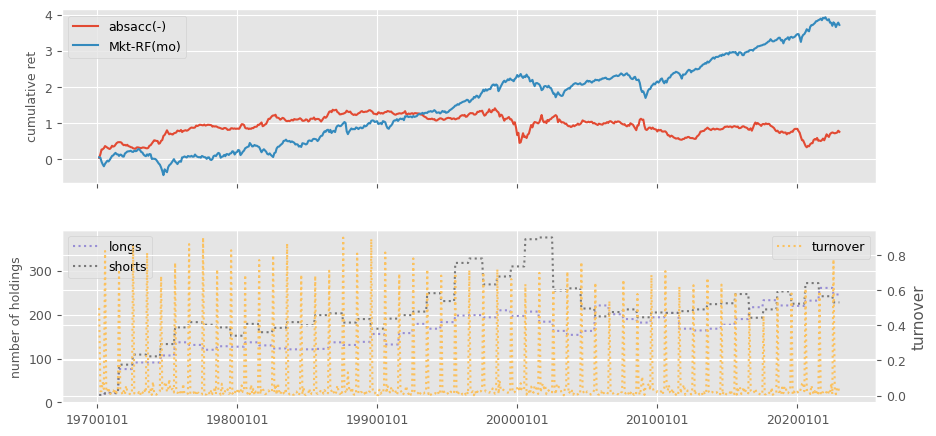

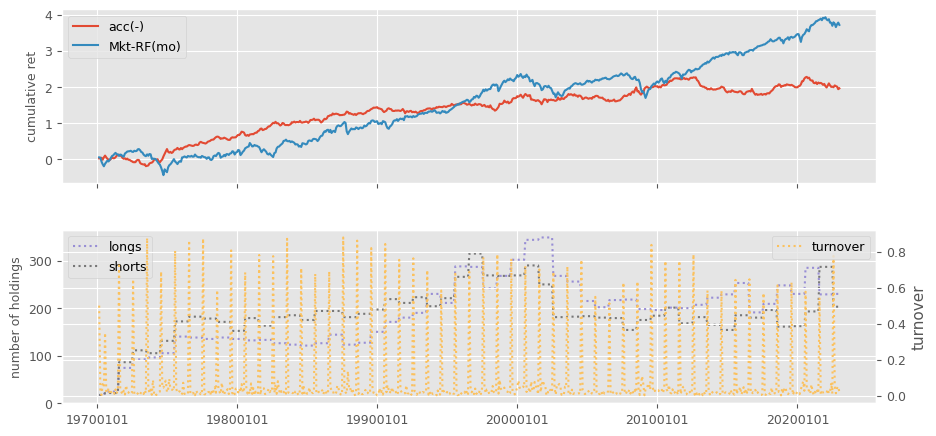

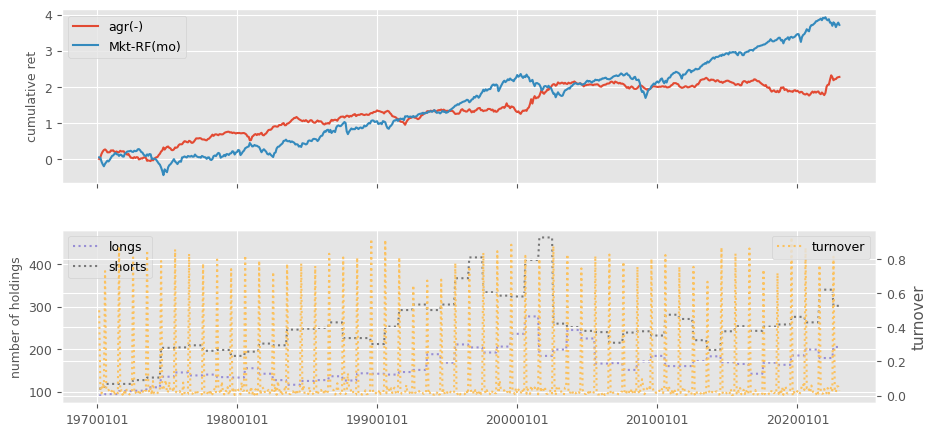

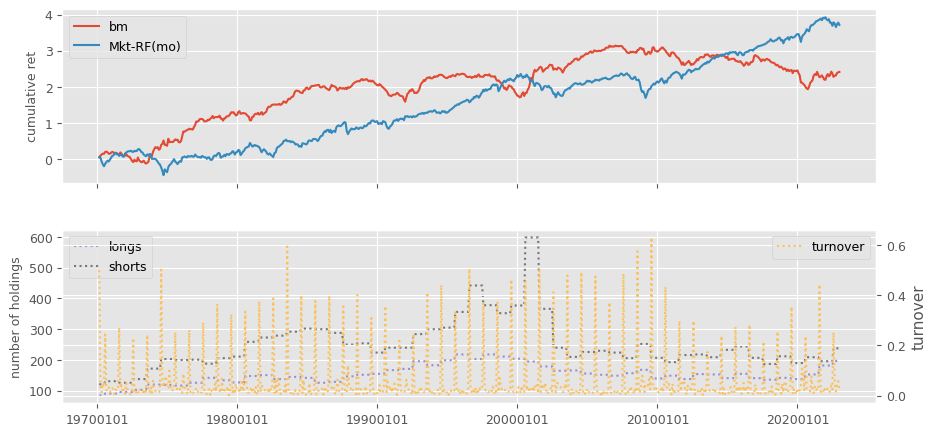

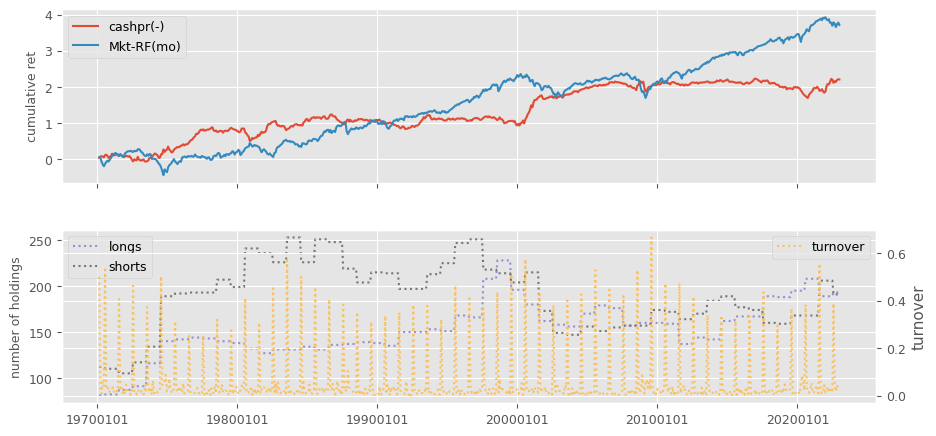

...

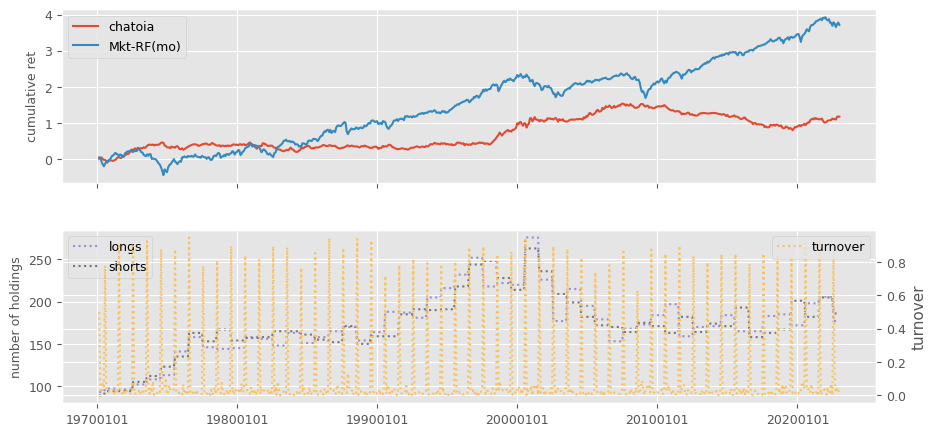

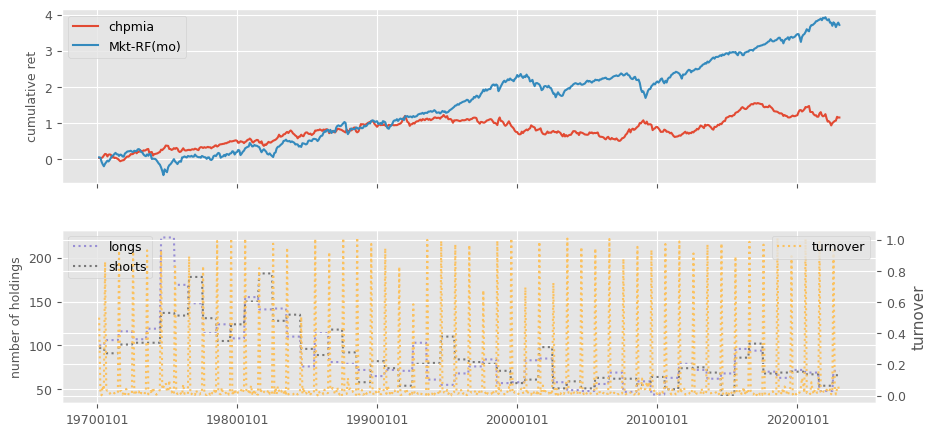

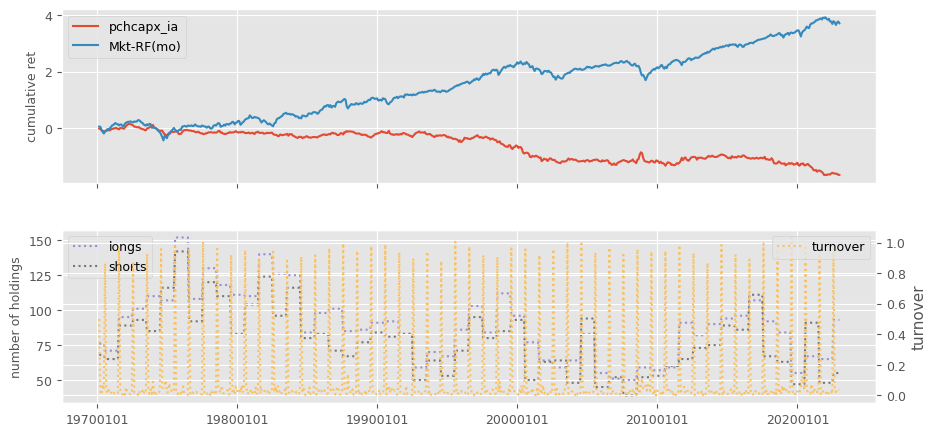

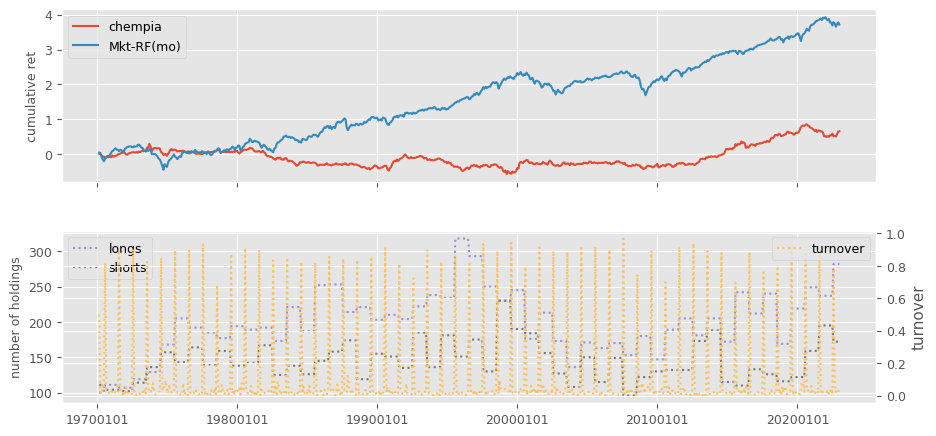

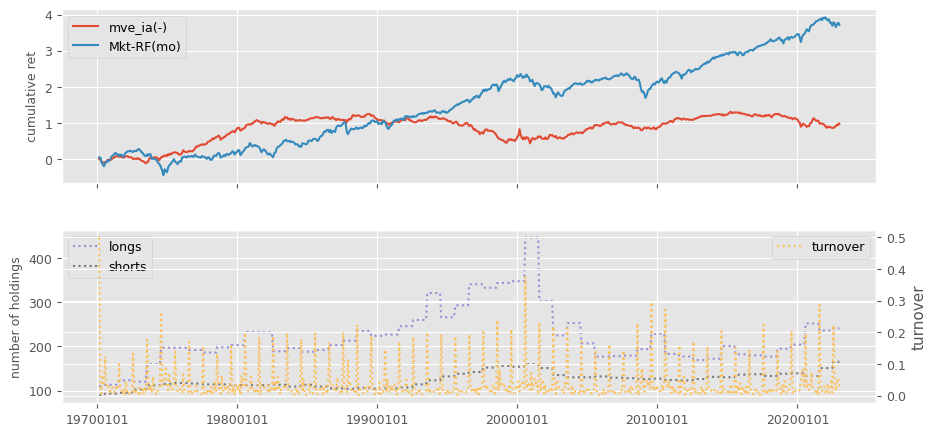

In [12]:
# Fundamental signals from Compustat Annual
if 'pstann' in testable:
    columns = ['absacc', 'acc', 'agr', 'bm', 'cashpr', 'cfp', 'chcsho',
               'chinv', 'depr', 'dy', 'egr', 'ep', 'gma', 'grcapx',
               'grltnoa', 'hire', 'invest', 'lev', 'lgr' ,
               'pchdepr', 'pchgm_pchsale', 'pchquick',
               'pchsale_pchinvt', 'pchsale_pchrect', 'pchsale_pchxsga',
               'pchsaleinv', 'pctacc', 'quick', 'rd_sale', 'rd_mve',
               'realestate', 'salecash', 'salerec', 'saleinv', 'secured',
               'sgr', 'sp', 'tang', 'bm_ia', 'cfp_ia', 'chatoia' , 'chpmia',
               'pchcapx_ia', 'chempia', 'mve_ia']
    numlag = 6       # number of months to lag data for rebalance
    end = LAST_DATE   # last data date

    if regenerate:
        # retrieve annual, keep [permno, datadate] with non null prccq if any
        fields = ['sic', 'fyear', 'ib', 'oancf', 'at', 'act', 'che', 'lct',
                  'dlc', 'dltt', 'prcc_f', 'csho', 'invt', 'dp', 'ppent',
                  'dvt', 'ceq', 'txp', 'revt', 'cogs', 'rect', 'aco', 'intan',
                  'ao', 'ap', 'lco', 'lo', 'capx', 'emp', 'ppegt', 'lt',
                  'sale', 'xsga', 'xrd', 'fatb', 'fatl', 'dm']
        df = pstat.get_linked(
            dataset='annual',
            fields=fields,
            date_field='datadate',
            where=(f"indfmt = 'INDL' "
                   f"  AND datafmt = 'STD'"
                   f"  AND curcd = 'USD' "
                   f"  AND popsrc = 'D'"
                   f"  AND consol = 'C'"
                   f"  AND datadate <= {end//100}31"))
        fund = df.sort_values(['permno', 'datadate', 'ib'])\
                 .drop_duplicates(['permno', 'datadate'])\
                 .dropna(subset=['ib'])
        fund.index = list(zip(fund['permno'], fund['datadate']))  # multi-index
        fund['rebaldate'] = bd.endmo(fund.datadate, numlag)

        # precompute, and lag common metrics: mve_f avg_at sic2
        fund['sic2'] = np.where(fund['sic'].notna(),
                                fund['sic'] // 100, 0)
        fund['fyear'] = fund['datadate'] // 10000      # can delete this
        fund['mve_f'] = fund['prcc_f'] * fund['csho']
    
        lag = fund.shift(1, fill_value=0)
        lag.loc[lag['permno'] != fund['permno'], fields] = np.nan
        fund['avg_at'] = (fund['at'] + lag['at']) / 2
    
        lag2 = fund.shift(2, fill_value=0)
        lag2.loc[lag2['permno'] != fund['permno'], fields] = np.nan
        lag['avg_at'] = (lag['at'] + lag2['at']) / 2
    
        fund['bm'] = fund['ceq'] / fund['mve_f']
        fund['cashpr'] = (fund['mve_f'] + fund['dltt'] - fund['at'])/fund['che']
        fund['depr'] = fund['dp'] / fund['ppent']
        fund['dy'] = fund['dvt'] / fund['mve_f']
        fund['ep'] = fund['ib'] / fund['mve_f']
        fund['lev'] = fund['lt'] / fund['mve_f']
        fund['quick'] = (fund['act'] - fund['invt']) / fund['lct']
        fund['rd_sale'] = fund['xrd'] / fund['sale']
        fund['rd_mve'] = fund['xrd'] / fund['mve_f']
        fund['realestate'] = ((fund['fatb'] + fund['fatl']) /
                              np.where(fund['ppegt'].notna(),
                                       fund['ppegt'], fund['ppent']))
        fund['salecash'] = fund['sale'] / fund['che']
        fund['salerec'] = fund['sale'] / fund['rect']
        fund['saleinv'] = fund['sale'] / fund['invt']
        fund['secured'] = fund['dm'] / fund['dltt']
        fund['sp'] = fund['sale'] / fund['mve_f']
        fund['tang'] = (fund['che']
                        + fund['rect'] * 0.715
                        + fund['invt'] * 0.547
                        + fund['ppent'] * 0.535) / fund['at']

        # changes: agr chcsho chinv egr gma egr grcapx grltnoa emp invest lgr
        fund['agr'] = (fund['at'] / lag['at'])
        fund['chcsho'] = (fund['csho'] / lag['csho'])
        fund['chinv'] = ((fund['invt'] - lag['invt']) / fund['avg_at'])
        fund['egr'] = (fund['ceq'] / lag['ceq'])
        fund['gma'] = ((fund['revt'] - fund['cogs']) / lag['at'])
        fund['grcapx'] = (fund['capx'] / lag2['capx'])
        fund['grltnoa'] =  (((fund['rect']
                              + fund['invt']
                              + fund['ppent']
                              + fund['aco']
                              + fund['intan']
                              + fund['ao']
                              - fund['ap']
                              - fund['lco']
                              - fund['lo'])
                             / (lag['rect']
                                + lag['invt']
                                + lag['ppent']
                                + lag['aco']
                                + lag['intan']
                                + lag['ao']
                                - lag['ap']
                                - lag['lco']
                                - lag['lo']))
                            - ((fund['rect']
                                + fund['invt']
                                + fund['aco']
                                - fund['ap']
                                - fund['lco'])
                               - (lag['rect']
                                  + lag['invt']
                                  + lag['aco']
                                  - lag['ap']
                                  - lag['lco']))) / fund['avg_at']
        fund['hire'] = ((fund['emp'] / lag['emp']) - 1).fillna(0)
        fund['invest'] = (((fund['ppegt'] - lag['ppegt'])
                           + (fund['invt'] - lag['invt'])) / lag['at'])
        fund['invest'] = fund['invest']\
            .where(fund['invest'].notna(),
                   ((fund['ppent'] - lag['ppent'])
                    + (fund['invt'] - lag['invt'])) / lag['at'])
        fund['lgr'] = (fund['lt'] / lag['lt'])
        fund['pchdepr'] = ((fund['dp'] / fund['ppent'])
                           / (lag['dp'] / lag['ppent']))
        fund['pchgm_pchsale'] = (((fund['sale'] - fund['cogs'])
                                  / (lag['sale'] - lag['cogs']))
                                 - (fund['sale'] / lag['sale']))
        fund['pchquick'] = (((fund['act'] - fund['invt']) / fund['lct'])
                            / ((lag['act'] - lag['invt']) / lag['lct']))
        fund['pchsale_pchinvt'] = ((fund['sale'] / lag['sale'])
                                   - (fund['invt'] / lag['invt']))
        fund['pchsale_pchrect'] = ((fund['sale'] / lag['sale'])
                                   - (fund['rect'] / lag['rect']))
        fund['pchsale_pchxsga'] = ((fund['sale'] / lag['sale'])
                                   - (fund['xsga'] / lag['xsga']))
        fund['pchsaleinv'] = ((fund['sale'] / fund['invt'])
                              / (lag['sale'] / lag['invt']))
        fund['sgr'] = (fund['sale'] / lag['sale'])

        fund['chato'] = ((fund['sale'] / fund['avg_at'])
                         - (lag['sale'] / lag['avg_at']))
        fund['chpm'] = (fund['ib'] / fund['sale']) - (lag['ib'] / lag['sale'])
        fund['pchcapx'] = fund['capx'] / lag['capx']
    
        # compute signals with alternative definitions: acc absacc cfp
        fund['_acc'] = (((fund['act'] - lag['act'])
                         - (fund['che'] - lag['che']))
                        - ((fund['lct'] - lag['lct'])
                           - (fund['dlc'] - lag['dlc'])
                           - (fund['txp'] - lag['txp'])
                           - fund['dp']))
        fund['cfp'] = ((fund['ib'] - (((fund['act'] - lag['act'])
                                       - (fund['che'] - lag['che']))
                                      - ((fund['lct'] - lag['lct'])
                                         - (fund['dlc'] - lag['dlc'])
                                         - (fund['txp'] - lag['txp'])
                                         - fund['dp']))) / fund['mve_f'])
        g = fund['oancf'].notnull()
        fund.loc[g, 'cfp'] = fund.loc[g, 'oancf'] / fund.loc[g, 'mve_f']
        fund.loc[g, '_acc'] = fund.loc[g, 'ib'] - fund.loc[g, 'oancf']
        fund['acc'] = fund['_acc'] / fund['avg_at']
        fund['absacc'] = abs(fund['_acc']) / fund['avg_at']
        fund['pctacc'] = fund['_acc'] / abs(fund['ib'])
        h = (fund['ib'].abs() <= 0.01)
        fund.loc[h, 'pctacc'] = fund.loc[h, '_acc'] / 0.01

        # industry-adjusted
        cols = {'bm_ia': 'bm', 'cfp_ia': 'cfp', 'chatoia': 'chato',
                'chpmia': 'chpm', 'pchcapx_ia': 'pchcapx',
                'chempia': 'hire', 'mve_ia': 'mve_f'}
        group = fund.groupby(['sic2', 'fyear'])
        for k,v in cols.items():
            fund[k] = fund[v] - group[v].transform('mean')

        for label in columns:
            signals.write(fund, label, overwrite=True)

    rebalbeg, rebalend = 19700101, LAST_DATE
    benchnames = ['Mkt-RF(mo)'] #['Mom']  #['ST_Rev(mo)']   #
    for num, label in enumerate(columns):
        holdings = univariate_sorts(crsp,
                                    label,
                                    SignalsFrame(signals.read(label)),
                                    rebalbeg,
                                    rebalend,
                                    window=12,
                                    months=[6],
                                    maxdecile=8,
                                    pct=(10., 90.),
                                    leverage=leverage.get(label, 1))
        excess = backtest_pipeline(backtest,
                                   crsp,
                                   holdings,
                                   label,
                                   benchnames,
                                   overlap=0,
                                   outdir=outdir,
                                   suffix=(leverage.get(label, 1) < 0)*'(-)')

           excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
stdacc(-)   0.017   0.138  0.041      0.359   -0.208    0.835     0.781  104.223  149.122  0.779  0.784
          excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
stdcf(-)   0.027   0.201  0.058      0.471   -0.678    0.498     0.755  105.559  154.275  0.751   0.76
        excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
roavol   0.006    0.04 -0.011     -0.074    0.207    0.836     0.715  206.097  174.855  0.709   0.72
        excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
sgrvol   0.036   0.238  0.016      0.112   -0.768    0.443     0.777  114.173  165.604  0.769  0.786
            excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
cinvest(-)    0.01   0.109  0.011      0.132   -0.769    0.442     3.239  163

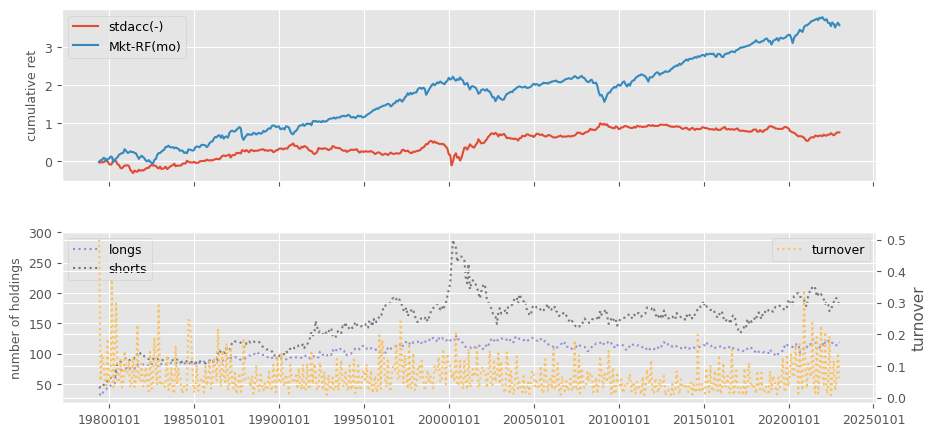

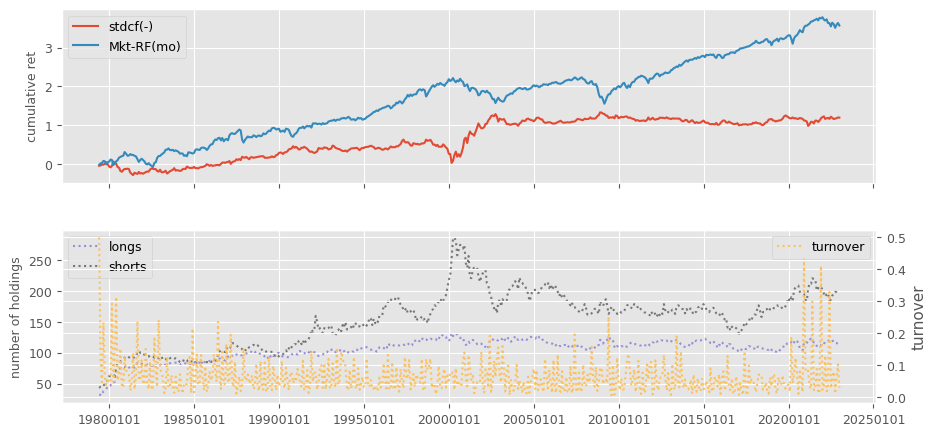

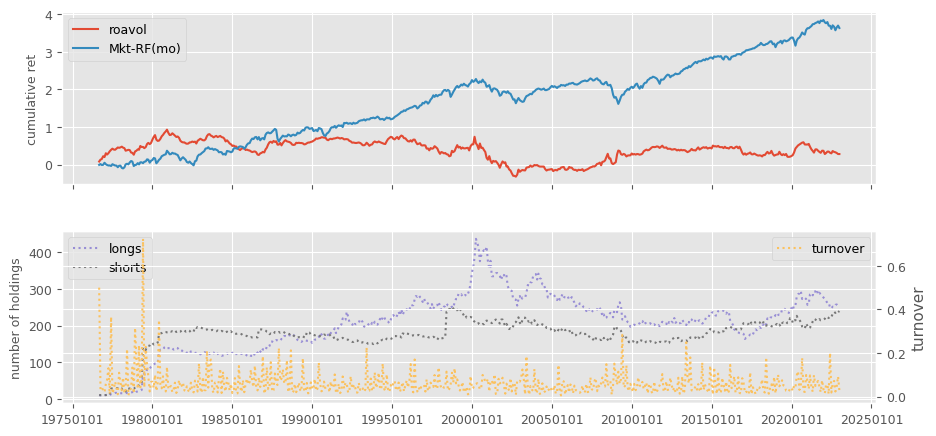

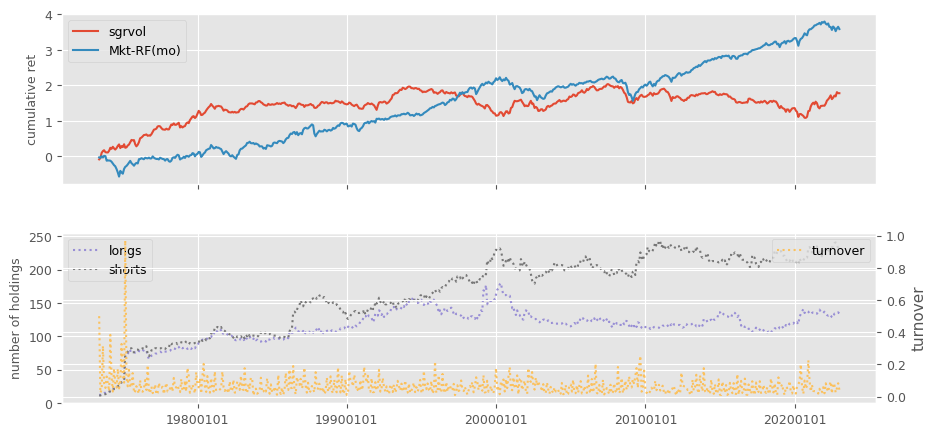

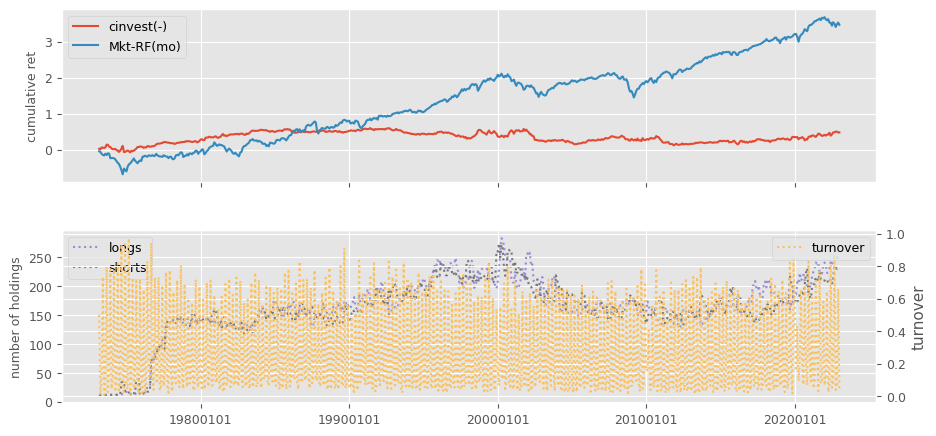

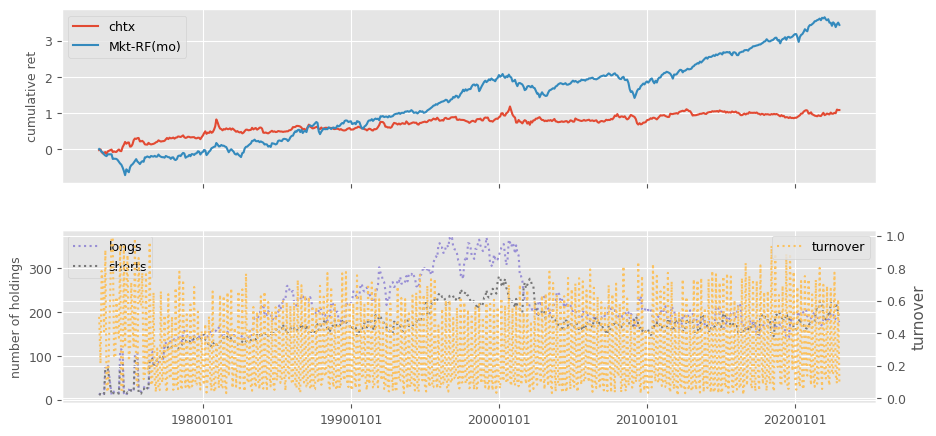

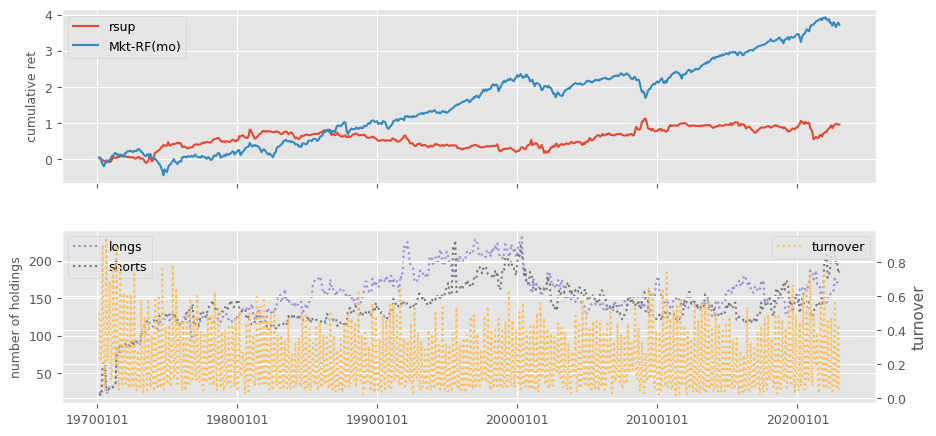

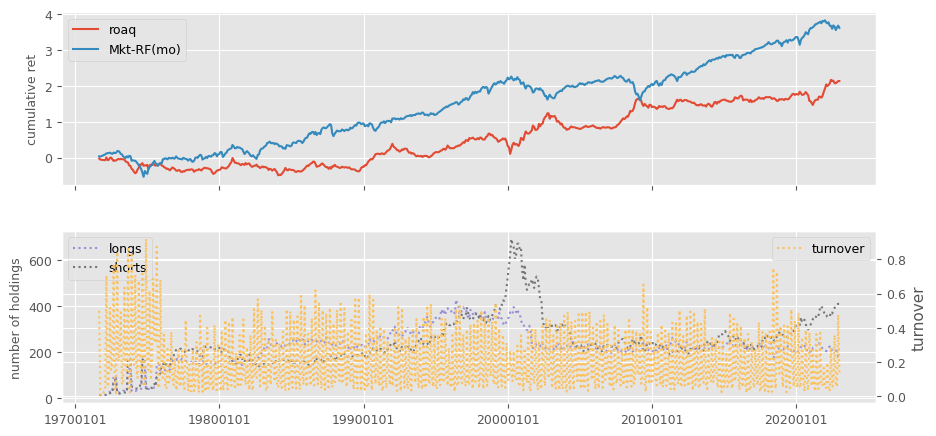

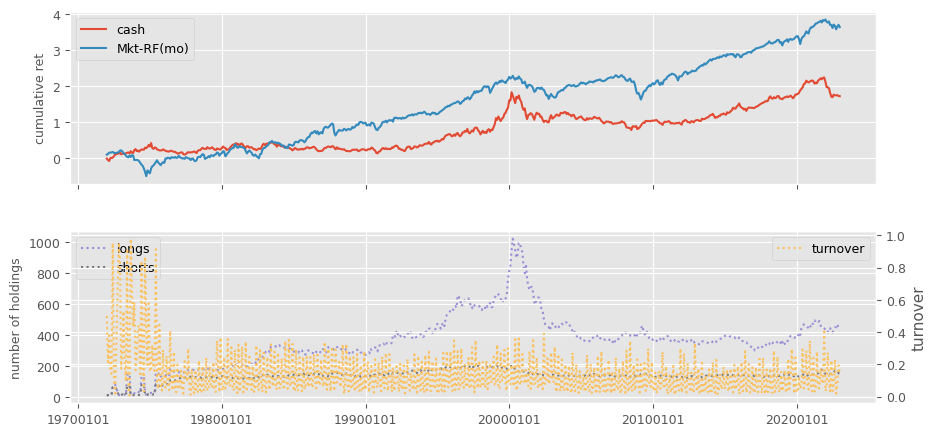

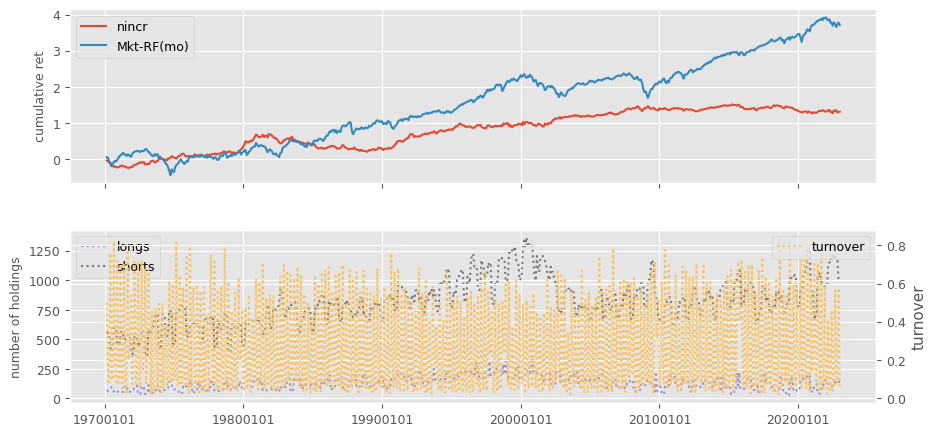

In [13]:
# Fundamental signals from Compustat Quarterly
if 'pstqtr' in testable:
    columns = ['stdacc', 'stdcf', 'roavol', 'sgrvol', 'cinvest', 'chtx',
               'rsup', 'roaq', 'cash', 'nincr']
    numlag = 4       # require 4 month lag of fiscal data
    end = LAST_DATE

    if regenerate:
        # retrieve quarterly, keep [permno, datadate] key with non null prccq
        fields = ['ibq', 'actq', 'cheq', 'lctq', 'dlcq', 'saleq', 'prccq',
                  'cshoq', 'atq', 'txtq', 'ppentq']
        df = pstat.get_linked(dataset='quarterly',
                              fields=fields,
                              date_field='datadate',
                              where=(f"datadate > 0 "
                                     f"and datadate <= {end//100}31"))
        fund = df.sort_values(['permno','datadate', 'ibq'])\
                 .drop_duplicates(['permno', 'datadate'])\
                 .dropna(subset=['ibq'])
        fund.index = list(zip(fund['permno'], fund['datadate']))
        rebaldate = bd.endmo(fund.datadate, numlag)

        # compute current and lagged: scf sacc roaq nincr cinvest cash rsup chtx
        lag = fund.shift(1, fill_value=0)
        lag.loc[lag['permno'] != fund['permno'], fields] = np.nan
        fund['_saleq'] = fund['saleq']
        fund.loc[fund['_saleq'].lt(0.01), '_saleq'] = 0.01
        
        fund['sacc'] = (((fund['actq'] - lag['actq'])
                         - (fund['cheq'] - lag['cheq']))
                        - ((fund['lctq'] - lag['lctq'])
                           - (fund['dlcq'] - lag['dlcq']))) / fund['_saleq']
        fund['cinvest'] = (fund['ppentq'] - lag['ppentq']) / fund['_saleq']
        fund['nincr'] = (fund['ibq'] > lag['ibq']).astype(int)
        fund['scf']  = (fund['ibq'] / fund['_saleq']) - fund['sacc']
        fund['roaq'] = (fund['ibq'] / lag['atq'])
        fund['cash'] = (fund['cheq'] / fund['atq'])
        
        lag4 = fund.shift(4, fill_value=0)
        lag4.loc[lag4['permno'] != fund['permno'], fields] = np.nan
        fund['rsup'] = ((fund['saleq'] - lag4['saleq'])
                        / (fund['prccq'].abs() * fund['cshoq'].abs()))
        fund['chtx'] = (fund['txtq'] - lag4['txtq']) / lag4['atq']

        # for each var: make dataframe of 15 lags (column names=[0,...,15])
        lags = {col : as_lags(fund, var=col, key='permno', nlags=16)
                for col in ['sacc', 'scf', 'roaq', 'rsup', 'cinvest', 'nincr']}
        for i in range(1, 16):                      # lags[ninrc][i]=1 iff ibq
            lags['nincr'][i] *= lags['nincr'][i-1]  # increasing all prior qtrs

        # compute signals from the 15 lags
        fund['rebaldate'] = rebaldate
        fund['stdacc'] = lags['sacc'].std(axis=1, skipna=False)
        fund['stdcf'] = lags['scf'].std(axis=1, skipna=False)
        fund['roavol'] = lags['roaq'].std(axis=1, skipna=False)
        fund['sgrvol'] = lags['rsup'].std(axis=1, skipna=False)
        fund['cinvest'] = (fund['cinvest'] -
                           lags['cinvest'][[1, 2, 3, 4]].mean(axis=1,
                                                              skipna=False))

        # count number of consecutive increasing quarters
        fund['nincr'] = lags['nincr'][np.arange(8)].sum(axis=1)

        for label in columns:
            signals.write(fund, label, overwrite=True)

    rebalbeg, rebalend = 19700101, LAST_DATE
    benchnames = ['Mkt-RF(mo)']
    for num, label in enumerate(columns):
        holdings = univariate_sorts(crsp,
                                    label,
                                    SignalsFrame(signals.read(label)),
                                    rebalbeg,
                                    rebalend,
                                    window=3,
                                    months=[],
                                    maxdecile=8,
                                    pct=(10., 90.),
                                    leverage=leverage.get(label, 1))
        excess = backtest_pipeline(backtest,
                                   crsp,
                                   holdings,
                                   label,
                                   benchnames,
                                   overlap=0,
                                   outdir=outdir,
                                   suffix='(-)'*(leverage.get(label, 1) < 0))

## Earnings Estimates

        excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
chfeps   0.054   0.446  0.062      0.516    -0.72    0.472     8.658  164.546  177.053  8.643  8.673
            excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
chnanalyst   0.005   0.062 -0.001     -0.008    0.019    0.985      6.86  112.005  273.968  6.858  6.862
         excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
disp(-)   0.064   0.366  0.106      0.683   -0.084    0.933     3.226  188.549  188.302  3.211  3.241


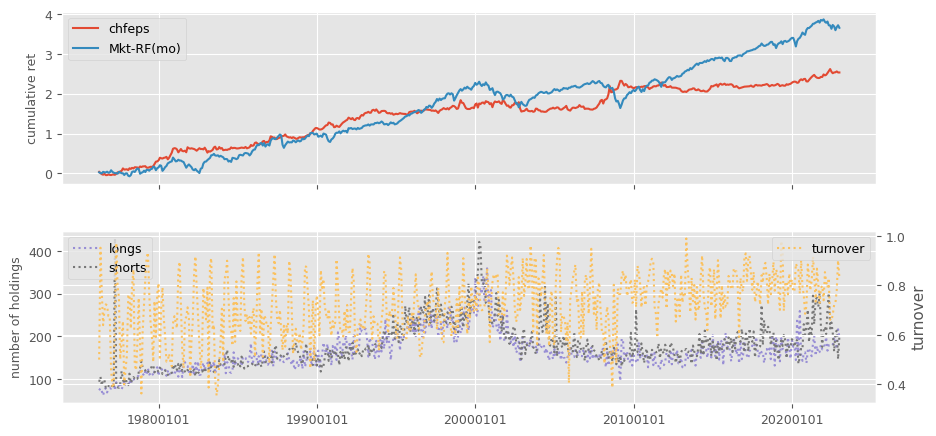

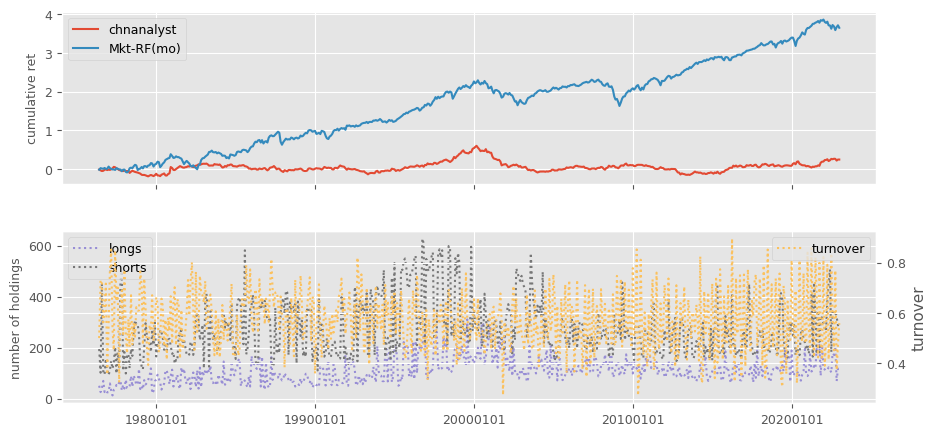

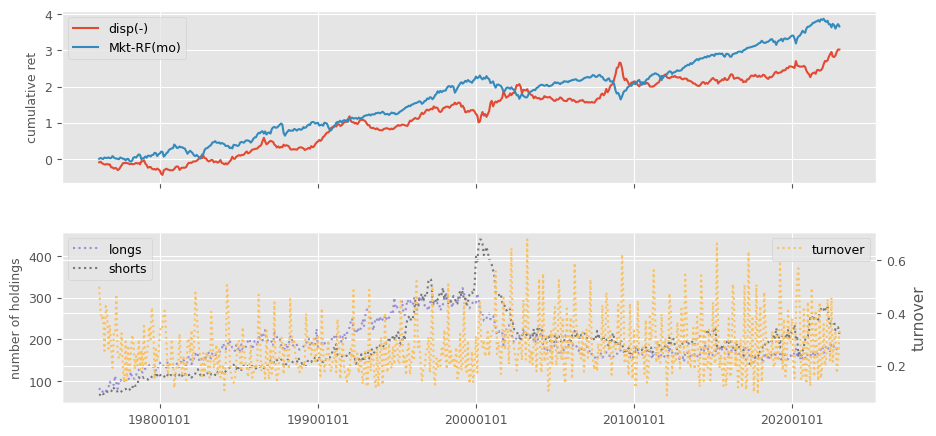

In [14]:
# IBES Fiscal Year 1 signals: chfeps, chnanalyst, disp
if 'ibesf1' in testable:
    columns = ['chfeps', 'chnanalyst', 'disp']

    if regenerate:
        df = ibes.get_linked(dataset='summary',
                             fields=['fpedats', 'meanest', 'medest',
                                     'stdev', 'numest'],
                             date_field = 'statpers',
                             where=("meanest IS NOT NULL "
                                    "  AND fpedats IS NOT NULL "
                                    "  AND statpers IS NOT NULL"
                                    "  AND fpi = '1'"))
        out = df.sort_values(['permno', 'statpers', 'fpedats', 'meanest'])\
                .drop_duplicates(['permno', 'statpers', 'fpedats'])
        out['rebaldate'] = bd.endmo(out['statpers'])

        out['disp'] = out['stdev'] / abs(out['meanest'])
        out.loc[abs(out['meanest']) < 0, 'disp'] = out['stdev'] / 0.01
    
        lag1 = out.shift(1, fill_value=0)
        f1 = (lag1['permno'] == out['permno'])        
        out.loc[f1, 'chfeps'] = out.loc[f1, 'meanest'] - lag1.loc[f1, 'meanest']

        lag3 = out.shift(3, fill_value=0)
        f3 = (lag3['permno'] == out['permno'])
        out.loc[f3, 'chnanalyst'] = out.loc[f3, 'numest']-lag3.loc[f3, 'numest']

        for label in columns:
            signals.write(out, label, overwrite=True)

    rebalbeg, rebalend = 19760101, LAST_DATE
    benchnames = ['Mkt-RF(mo)']
    for num, label in enumerate(columns):
        holdings = univariate_sorts(crsp,
                                    label,
                                    SignalsFrame(signals.read(label)),
                                    rebalbeg,
                                    rebalend,
                                    window=3,
                                    months=[],
                                    maxdecile=8,
                                    pct=(10., 90.),
                                    leverage=leverage.get(label, 1))
        excess = backtest_pipeline(backtest,
                                   crsp,
                                   holdings,
                                   label,
                                   benchnames,
                                   overlap=0,
                                   outdir=outdir,
                                   suffix=(leverage.get(label, 1) < 0)*'(-)')

        excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover   longs   shorts   buys  sells
fgr5yr  -0.001  -0.005 -0.058     -0.302    0.054    0.957     1.563  323.36  121.951  1.552  1.574


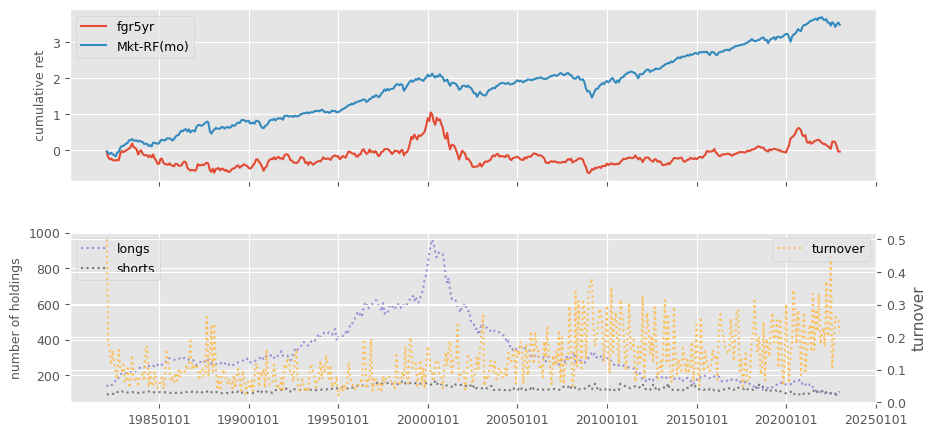

In [15]:
# IBES Long-term Growth signals: fgr5yr
if 'ibesltg' in testable:
    columns = ['fgr5yr']

    if regenerate:
        df = ibes.get_linked(dataset='summary',
                             fields = ['meanest'],
                             date_field = 'statpers',
                             where=("meanest IS NOT NULL "
                                    "  AND fpi = '0'"
                                    "  AND statpers IS NOT NULL"))
        out = df.sort_values(['permno', 'statpers', 'meanest'])\
                .drop_duplicates(['permno', 'statpers'])\
                .dropna()
        out['rebaldate'] = bd.endmo(out['statpers'])
        out['fgr5yr'] = out['meanest']
        signals.write(out, 'fgr5yr', overwrite=True)

    rebalbeg, rebalend = 19760101, LAST_DATE
    benchnames = ['Mkt-RF(mo)']
    for num, label in enumerate(columns):
        holdings = univariate_sorts(crsp,
                                    label,
                                    SignalsFrame(signals.read(label)),
                                    rebalbeg,
                                    rebalend,
                                    window=3,
                                    months=[],
                                    maxdecile=8,
                                    pct=(10., 90.),
                                    leverage=leverage.get(label, 1))
        excess = backtest_pipeline(backtest,
                                   crsp,
                                   holdings,
                                   label,
                                   benchnames,
                                   overlap=0,
                                   outdir=outdir,
                                   suffix=(leverage.get(label, 1) < 0)*'(-)')

     excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
ear   0.017   0.148 -0.005     -0.051    0.805    0.421     2.101  252.951  177.967  2.093   2.11
           excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
aeavol(-)    0.03   0.274  0.044      0.417   -0.518    0.604     1.943  224.389  146.137  1.934  1.953


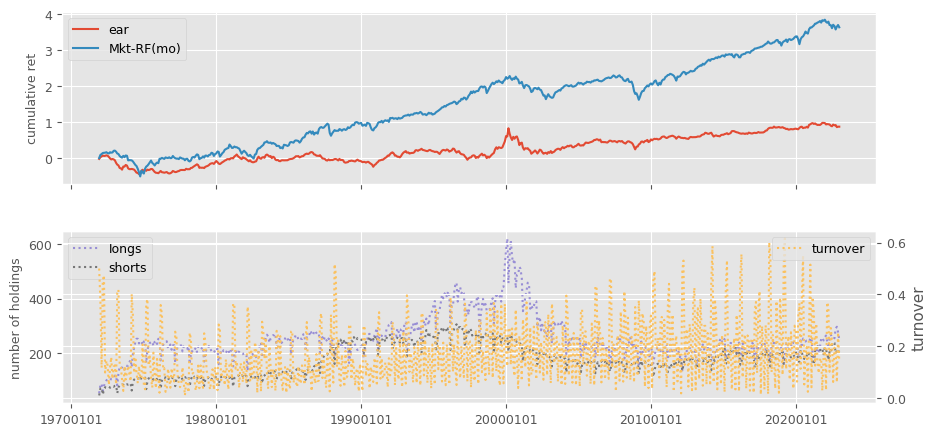

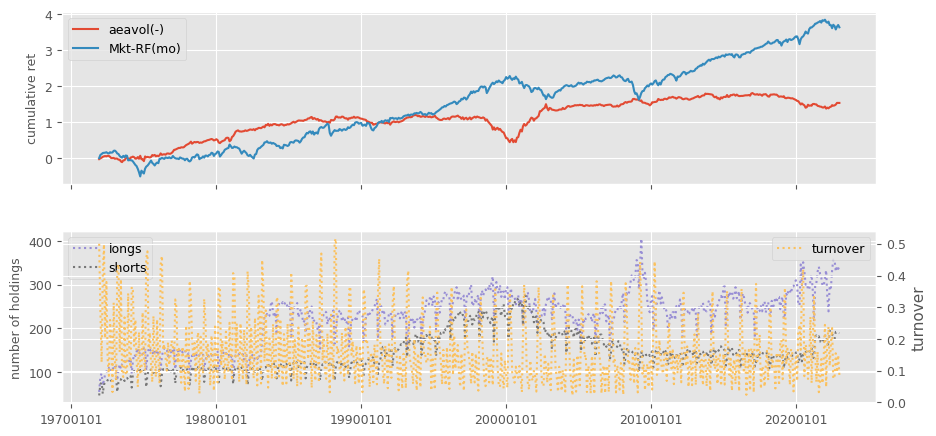

In [16]:
# Announcement date (rdq) in Quarterly, linked to CRSP daily: ear, aeavol
if 'rdq_daily' in testable:
    columns = ['ear', 'aeavol']

    if regenerate:
        # retrieve rdq, and set rebalance date to at least one month delay
        df = pstat.get_linked(dataset='quarterly',
                              fields=['rdq'],
                              date_field='datadate',
                              where=('rdq > 0'))
        fund = df.sort_values(['permno', 'rdq', 'datadate'])\
                 .drop_duplicates(['permno', 'rdq'])\
                 .dropna()
        fund['rebaldate'] = bd.offset(fund['rdq'], 2)

        # ear is compounded return around 3-day window
        out = crsp.get_window(dataset='daily',
                              field='ret',
                              date_field='date',
                              permnos=fund['permno'],
                              dates=fund['rdq'],
                              left=-1,
                              right=1)
        fund['ear'] = (1 + out).prod(axis = 1).values

                              
        # aeavol is avg volume in 3-day window to 20-day average ten-days prior
        actual = crsp.get_window(dataset='daily',
                                 field='vol',
                                 date_field='date',
                                 permnos=fund['permno'],
                                 dates=fund['rdq'],
                                 left=-1,
                                 right=1)
        normal = crsp.get_window(dataset='daily',
                                 field='vol',
                                 date_field='date',
                                 permnos=fund['permno'],
                                 dates=fund['rdq'],
                                 left=-30,
                                 right=-11,
                                 avg=True)
        fund['aeavol'] = normal['vol'].values
    
        signals.write(fund, 'ear', overwrite=True)
        signals.write(fund, 'aeavol', overwrite=True)

    rebalbeg, rebalend = 19700101, LAST_DATE
    benchnames = ['Mkt-RF(mo)']
    for num, label in enumerate(columns):
        holdings = univariate_sorts(crsp,
                                    label,
                                    SignalsFrame(signals.read(label)),
                                    rebalbeg,
                                    rebalend,
                                    window=3,
                                    months=[],
                                    maxdecile=8,
                                    pct=(10., 90.),
                                    leverage=leverage.get(label, 1))
        excess = backtest_pipeline(backtest,
                                   crsp,
                                   holdings,
                                   label,
                                   benchnames,
                                   overlap=0,
                                   outdir=outdir,
                                   suffix=(leverage.get(label, 1) < 0)*'(-)')

      excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
sfeq  -0.197  -1.229 -0.188      -1.18    0.008    0.994      1.41  150.655  278.453  1.466  1.355


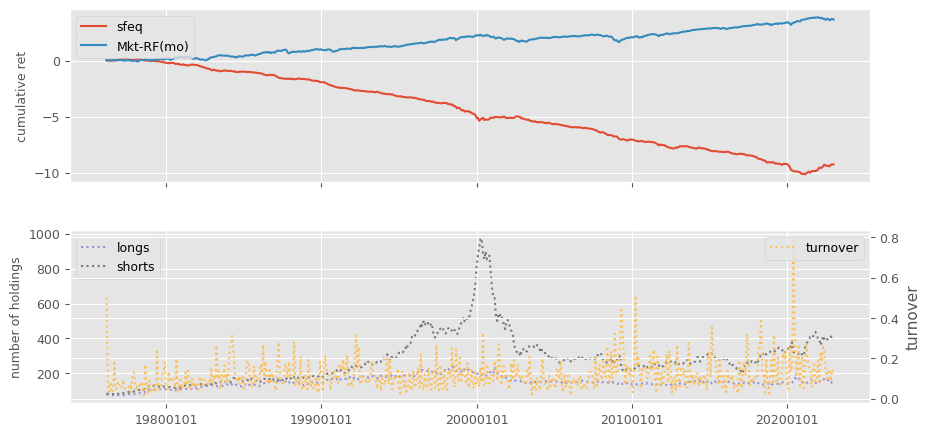

In [17]:
# IBES Fiscal Year 1 linked to Quarterly PSTAT: sfeq
if 'ibesf1_pstqtr' in testable:
    beg, end = 19760101, LAST_DATE
    monthnum = lambda d: ((d//10000)-1900)*12 + ((d//100)%100) - 1
    if regenerate:
        df = pstat.get_linked(dataset='quarterly',
                              fields=['prccq'],
                              date_field='datadate')
        df = df.dropna()\
               .sort_values(['permno', 'datadate'])\
               .drop_duplicates(['permno', 'datadate'])
        
        out = ibes.get_linked(dataset='summary',
                              fields=['fpedats', 'meanest'],
                              date_field='statpers',
                              where="fpi='1'")
        out = out.dropna()\
                 .sort_values(['permno', 'statpers', 'fpedats'])\
                 .drop_duplicates(['permno', 'statpers'])
        out['monthnum'] = monthnum(out['statpers'])
        out = out.set_index(['permno', 'monthnum'], drop=False)
        out['sfeq'] = np.nan

        for num in range(4): # match ibes statpers to any datadate in last 4 mos
            df['monthnum'] = monthnum(df['datadate']) - num
            df = df.set_index(['permno', 'monthnum'], drop=False)
            out = out.join(df[['prccq']], how='left')
            out['sfeq'] = out['sfeq'].where(out['sfeq'].notna(),
                                          out['meanest'] / out['prccq'].abs())
            out = out.drop(columns=['prccq'])

        out['rebaldate'] = bd.endmo(out['statpers'])
        n = signals.write(out.reset_index(drop=True), 'sfeq', overwrite=True)
        
    rebalbeg, rebalend = 19760101, LAST_DATE
    benchnames = ['Mkt-RF(mo)']
    label = 'sfeq'
    holdings = univariate_sorts(crsp,
                                label,
                                SignalsFrame(signals.read(label)),
                                rebalbeg,
                                rebalend,
                                window=3,
                                months=[],
                                maxdecile=8,
                                pct=(10., 90.),
                                leverage=leverage.get(label, 1))
    excess = backtest_pipeline(backtest,
                               crsp,
                               holdings,
                               label,
                               benchnames,
                               overlap=0,
                               outdir=outdir, 
                               suffix=(leverage.get(label, 1) < 0)*'(-)')

     excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
sfe   0.055   0.301  0.081      0.468    0.067    0.947     2.117  149.174  300.453  2.111  2.124


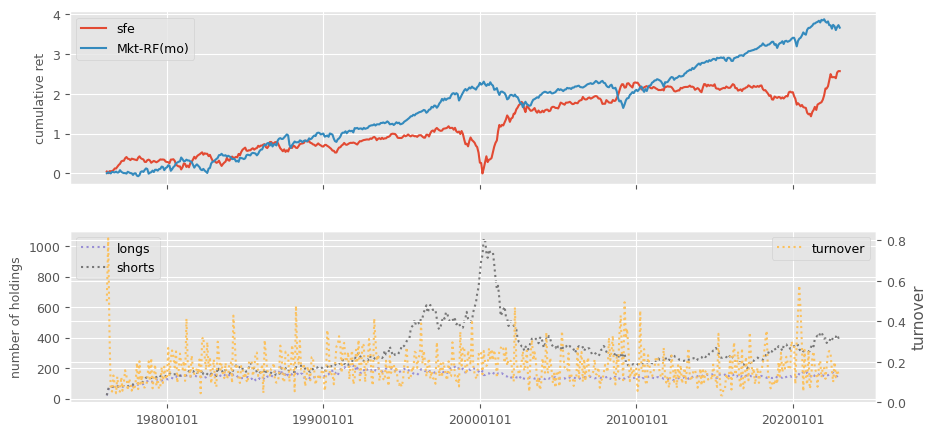

In [18]:
# IBES Fiscal Year 1 linked to IBES price history: sfe
if 'ibesf1_hist' in testable:
    beg, end = 19760101, LAST_DATE
    if regenerate:
        # retrieve monthly price history
        df = ibes.get_linked(dataset='history',
                             fields=['price'],
                             date_field='statpers')
        hist = df.dropna()\
                 .sort_values(['permno', 'statpers'])\
                 .drop_duplicates(['permno', 'statpers'], keep='last')\
                 .set_index(['permno', 'statpers'])

        # retrieve monthly FY1 mean estimate
        df = ibes.get_linked(dataset='summary',
                             fields=['fpedats', 'meanest'],
                             date_field='statpers',
                             where="fpi='1' AND statpers <= fpedats")
        out = df.dropna()\
                .sort_values(['permno', 'statpers', 'fpedats'])\
                .drop_duplicates(['permno', 'statpers'])\
                .set_index(['permno', 'statpers'])

        # join on [permno, statpers], and reindex on [permno, rebaldate]
        out = out.join(hist[['price']], how='left').reset_index()
        out['rebaldate'] = bd.endmo(out['statpers'])
        out = out.set_index(['permno', 'rebaldate'])
        out['sfe'] = out['meanest'].div(out['price'].abs())
        n = signals.write(out.reset_index(), 'sfe', overwrite=True)
        
    rebalbeg, rebalend = 19760101, LAST_DATE
    benchnames = ['Mkt-RF(mo)']
    label = 'sfe'
    holdings = univariate_sorts(crsp,
                                label,
                                SignalsFrame(signals.read(label)),
                                rebalbeg,
                                rebalend,
                                window=3,
                                months=[],
                                maxdecile=8,
                                pct=(10., 90.),
                                leverage=leverage.get(label, 1))
    excess = backtest_pipeline(backtest,
                               crsp,
                               holdings,
                               label,
                               benchnames,
                               overlap=0,
                               outdir=outdir, 
                               suffix=(leverage.get(label, 1) < 0)*'(-)')

     excess  sharpe  alpha  appraisal  welch-t  welch-p  turnover    longs   shorts   buys  sells
sue   0.043   0.407  0.044      0.413    0.209    0.834     3.497  187.091  174.808  3.486  3.509


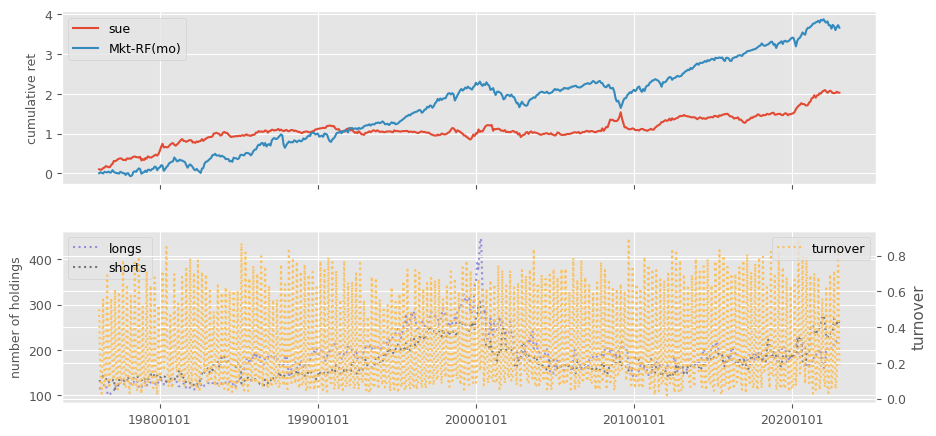

In [19]:
# IBES Fiscal Quarter 1, linked to Quarterly: sue
if 'ibesq1_pstqtr' in testable:
    columns = ['sue']
    numlag = 4
    end = LAST_DATE

    if regenerate:
        # retrieve quarterly, keep [permno, datadate] key with non null prccq
        df = pstat.get_linked(dataset='quarterly',
                              fields=['prccq', 'cshoq', 'ibq'],
                              date_field='datadate',
                              where=f"datadate <= {end//100}31")
        fund = df.dropna(subset=['ibq'])\
                 .sort_values(['permno', 'datadate', 'cshoq'])\
                 .drop_duplicates(['permno', 'datadate'])
        fund['rebaldate'] = bd.endmo(fund['datadate'], numlag)
        fund = fund.set_index(['permno', 'rebaldate'], drop=False)

        # retrieve ibes Q1 where forecast period <= fiscal date, keep latest
        df = ibes.get_linked(dataset='summary',
                             fields=['fpedats', 'medest', 'actual'],
                             date_field='statpers',
                             where=" fpi = '6' AND statpers <= fpedats")
        summ = df.dropna()\
                 .sort_values(['permno', 'fpedats', 'statpers'])\
                 .drop_duplicates(['permno', 'fpedats'], keep='last')
        summ['rebaldate'] = bd.endmo(summ['fpedats'], numlag)
        summ = summ.set_index(['permno', 'statpers'])

        # retrieve ibes price, then left join
        df = ibes.get_linked(dataset='history',
                             fields=['price'],
                             date_field='statpers')
        hist = df.dropna()\
                 .sort_values(['permno', 'statpers'])\
                 .drop_duplicates(['permno', 'statpers'], keep='last')
        hist = hist.set_index(['permno', 'statpers'])
        summ = summ.join(hist[['price']], how='left')
        summ = summ.reset_index()\
                   .set_index(['permno', 'rebaldate'])\
                   .reindex(fund.index)

        # sue with ibes surprise and price
        fund['sue'] = (summ['actual'] - summ['medest']) / summ['price'].abs()

        # sue with ibes surprice and compustat quarterly price
        fund['sue'] = fund['sue']\
            .where(fund['sue'].notna(),
                   (summ['actual'] - summ['medest']) / fund['prccq'].abs())

        # sue with lag(4) difference in compustat quarterly and price
        lag = fund.shift(4, fill_value=0)
        fund['sue'] = fund['sue']\
            .where(fund['sue'].notna() | (lag['permno'] != fund['permno']),
                   ((fund['ibq'] - lag['ibq']) /
                    (fund['prccq'] * fund['cshoq'])).abs())

        signals.write(fund.reset_index(drop=True), 'sue', overwrite=True)

    rebalbeg, rebalend = 19760101, LAST_DATE
    benchnames = ['Mkt-RF(mo)']
    for num, label in enumerate(columns):
        holdings = univariate_sorts(crsp,
                                    label,
                                    SignalsFrame(signals.read(label)),
                                    rebalbeg,
                                    rebalend,
                                    window=3,
                                    months=[],
                                    maxdecile=8,
                                    pct=(10., 90.),
                                    leverage=leverage.get(label, 1))
        excess = backtest_pipeline(backtest,
                                   crsp,
                                   holdings,
                                   label,
                                   benchnames,
                                   overlap=0,
                                   outdir=outdir,
                                   suffix=(leverage.get(label, 1) < 0)*'(-)')

## Performance evaluation

In [30]:
# Summarize all results
# sorted by Welch's t-value testing for difference in pre- and post-2002 mean
if 'summarize' in testable:
    zoo = backtest.read().sort_values(['begret', 'permno'])
    r = []
    for label in zoo.index:
        perf = backtest.read(label)
        excess = {'ret': backtest.fit(['Mkt-RF(mo)'])}
        excess['annualized'] = backtest.annualized
        excess['dd'] = maximum_drawdown(backtest.perf['excess'])
        post = {'ret': backtest.fit(['Mkt-RF(mo)'],
                                    beg=20020101).copy()}
        post['annualized'] = backtest.annualized.copy()
        s = label + ('(-)' if leverage.get(label, 1) < 0 else '')
        r.append(DataFrame({
            'Start': excess['ret'].index[0],
            'Sharpe Ratio': excess['annualized']['sharpe'],
            'Alpha': excess['annualized']['alpha'],
            'Appraisal Ratio': excess['annualized']['appraisal'],
            'Avg Ret': excess['ret']['excess'].mean(),
            'Vol': excess['ret']['excess'].std(ddof=0),
            'Welch-t': excess['annualized']['welch-t'],
            'Appraisal2002': post['annualized']['appraisal'],
            'Ret2002': post['ret']['excess'].mean(),
            'Vol2002': post['ret']['excess'].std(ddof=0),            
            'Best' : excess['ret']['excess'].idxmax(),
            'BestRet' : excess['ret']['excess'].max(),
            'Worst' : excess['ret']['excess'].idxmin(),
            'WorstRet' : excess['ret']['excess'].min(),
            'Drawdown': (excess['dd'].iloc[1]/excess['dd'].iloc[0]) - 1,
            'Beg': excess['dd'].index[0],
            'End': excess['dd'].index[1],
            'Turn2002+': post['annualized']['sells']/12,
            'Long2002+': int(post['annualized']['longs']),
            'Short2002+': int(post['annualized']['shorts'])}, index=[s]))
    df = pd.concat(r, axis=0).round(4).sort_values('Welch-t')
#    with open(outdir / 'summary.tex', 'wt') as f:
#        _show = Show(ndigits=4, latex=True)
#        f.write(_show(df.loc[:, :'Vol2002'],
#                     caption="Factor Performance Summary Part I"))
#        f.write(_show(df.loc[:, 'Best':],
#                     caption="Factor Performance Summary Part II"))
show(df)

,Start,Sharpe Ratio,Alpha,Appraisal Ratio,Avg Ret,Vol,Welch-t,Appraisal2002,Ret2002,Vol2002,Best,BestRet,Worst,WorstRet,Drawdown,Beg,End,Turn2002+,Long2002+,Short2002+
pchsale_pchrect,19700227,-0.0478,-0.0060,-0.0721,-0.0003,0.0241,-2.8638,-0.5704,-0.0037,0.0243,19991231,0.1156,20110729,-0.0897,-0.7802,20000229,20221230,0.0937,203,201
mom1m(-),19260331,0.4082,0.0615,0.3426,0.0065,0.0537,-2.3080,-0.2204,-0.0003,0.0520,19320130,0.3023,19320831,-0.2805,-0.6682,19890929,20090227,0.9185,218,229
pchsaleinv,19700227,0.2231,0.0182,0.2091,0.0016,0.0251,-1.9123,-0.1762,-0.0008,0.0274,20211029,0.1069,19741031,-0.0799,-0.4978,20050831,20210226,0.0872,176,173
bm,19700227,0.2918,0.0440,0.2825,0.0038,0.0450,-1.8675,-0.1753,-0.0003,0.0451,19750131,0.1952,20200331,-0.2009,-0.7468,20060731,20200930,0.0502,153,219
chmom,19270228,0.4147,0.0532,0.3263,0.0060,0.0494,-1.8010,-0.0494,0.0013,0.0468,19330429,0.3721,20010228,-0.2282,-0.5541,20141031,20220630,0.5523,220,222
pchsale_pchinvt,19700227,0.3106,0.0277,0.3068,0.0023,0.0261,-1.7845,-0.0464,-0.0000,0.0287,20000929,0.1144,20011130,-0.0827,-0.4448,20050831,20160129,0.0876,182,174
pchdepr,19700227,0.0380,0.0036,0.0394,0.0003,0.0263,-1.6582,-0.2177,-0.0018,0.0260,19991231,0.1332,20000428,-0.1406,-0.6629,19991231,20211130,0.0901,225,217
ep,19700227,0.2762,0.0612,0.4006,0.0036,0.0456,-1.5214,0.1572,0.0003,0.0414,20001130,0.2241,20000229,-0.1896,-0.6611,20081128,20220930,0.0764,144,254
lev,19700227,0.0613,0.0059,0.0362,0.0008,0.0473,-1.5075,-0.2879,-0.0027,0.0507,20161130,0.1688,20090130,-0.2042,-0.8672,20060731,20200930,0.0342,197,393
realestate,19850430,0.0638,0.0424,0.2881,0.0008,0.0458,-1.4225,0.0927,-0.0020,0.0372,20001130,0.3043,20000229,-0.2518,-0.6669,20020930,20220531,0.0380,103,130
